# Interest Rate Category Prediction

In [96]:
#Importing Libraries
#For Handling DataFtrame 
import pandas as pd
import numpy as np
import scipy
import re

#For Visualization
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import matplotlib
matplotlib.use('nbagg')

import seaborn as sns


#Data Preprocessing 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA


#For Model Selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

#For Model Evaluation
from sklearn.metrics import accuracy_score, log_loss
from sklearn.metrics import roc_auc_score,f1_score,recall_score,precision_score,plot_confusion_matrix,confusion_matrix,classification_report

#Classification Models
from catboost import CatBoostClassifier, Pool, cv
from lightgbm import LGBMClassifier


import warnings

warnings.simplefilter('ignore')

In [2]:
%matplotlib inline

## Data Information

Ge the data from :https://datahack.analyticsvidhya.com/contest/janatahack-machine-learning-for-banking/

In [3]:
#Loading The Data
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [4]:
#Snapshot of Train Data
train_data.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1
1,10000002,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3
2,10000003,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3
3,10000004,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3
4,10000005,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1


In [5]:
#Snapshot of Test Data
test_data.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender
0,10164310,"27,500",10+ years,Mortgage,129000.0,VERIFIED - income,debt_consolidation,12.87,0,68.0,10,37,Male
1,10164311,"26,000",10+ years,NaN,110000.0,not verified,credit_card,11.37,0,NaN,6,23,Male
2,10164312,"6,075",< 1 year,Rent,75000.0,VERIFIED - income,debt_consolidation,6.83,2,NaN,5,20,Male
3,10164313,"12,000",10+ years,Mortgage,73000.0,VERIFIED - income source,debt_consolidation,7.76,0,NaN,6,8,Male
4,10164314,"35,000",< 1 year,Mortgage,156000.0,not verified,debt_consolidation,9.62,0,26.0,9,21,Male


In [6]:
train_data['Home_Owner'].unique()

array(['Rent', 'Mortgage', nan, 'Own', 'Other', 'None'], dtype=object)

In [7]:
#Looking at features & Values
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  object 
 2   Length_Employed          156938 non-null  object 
 3   Home_Owner               138960 non-null  object 
 4   Annual_Income            139207 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  75930 non-null   float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

 ##                                                 Features in the dataset
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>Loan_ID</td>
		<td>
		Unique ID for every customer
		</td>
	</tr>
	<tr>
		<td>Loan_Amount_Requested</td>
		<td>TLoan amount requested in Rupees</td>
	</tr>
	<tr>
		<td>Length_Employed</td>
		<td>Range of total working duration  in years</td>
	</tr>
	<tr>
		<td>Home_Owner</td>
		<td>Information about home if he is owned,rented, mortgage etc.</td>
	</tr>
	<tr>
		<td>Annual_Income</td>
		<td>Annual Income of the customer</td>
	</tr>
	<tr>
		<td>Income_Verified</td>
		<td>If Income is verified by the bank</td>
	</tr>
	<tr>
		<td>Purpose_Of_Loan</td>
		<td>Purpose of Loan such as Car Loan,Home Loan etc</td>
	</tr>
	<tr>
		<td>Debt_To_Income</td>
		<td>The ratio of Total Debt & Total Income (@ Present)</td>
	</tr>
	<tr>
		<td>Inquiries_Last_6Mo</td>
		<td>how many times the bank got call for inquiry by customer</td>
	</tr>
	<tr>
		<td>Months_Since_Deliquency</td>
		<td>How many months have been past since last deliquency</td>
	</tr>
	<tr>
		<td>Number_Open_Accounts</td>
		<td>Total number of open accounts</td>
	</tr>    
	<tr>
		<td>Total_Accounts</td>
		<td>Total number of accounts</td>
	</tr>    
	<tr>
		<td>Gender</td>
		<td>Gender of the customer</td>
	</tr> 
    	<tr>
		<td><b>Interest_Rate (Target Variable)</b></td>
		<td><b>Interest Rate Category (1/2/3)</b></td>
	</tr> 
</table>

# Problem Formulation
<p><b>MultiClass Classification</b></p>
<br>
-<i> To find the correct Interest Rate Category among 1,2 and 3</i>
<p> 
To solve the above we would be using train data provided by Analytics Vidhya  
</p>

# Performance metrics
1. Log Loss
2. Accuracy
3. F1 Score
4. Precision
5. Recall
6. Confusion Matrix

## Data Visualization & Data Cleaning

In this section we work on features

In [8]:
#Data Descriptiion
train_data.describe()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,1.643090e+05,1.392070e+05,164309.000000,164309.000000,75930.000000,164309.000000,164309.000000,164309.000000
mean,1.008216e+07,7.333116e+04,17.207189,0.781698,34.229356,11.193818,25.067665,2.158951
std,4.743207e+04,6.037750e+04,7.845083,1.034747,21.761180,4.991813,11.583067,0.738364
min,1.000000e+07,4.000000e+03,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,1.004108e+07,4.500000e+04,11.370000,0.000000,16.000000,8.000000,17.000000,2.000000
50%,1.008216e+07,6.300000e+04,16.840000,0.000000,31.000000,10.000000,23.000000,2.000000
75%,1.012323e+07,8.869750e+04,22.780000,1.000000,50.000000,14.000000,32.000000,3.000000
max,1.016431e+07,7.500000e+06,39.990000,8.000000,180.000000,76.000000,156.000000,3.000000


In [9]:
#Analysing the relationship b/w Features
train_data.corr()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
Loan_ID,1.000000,0.008326,-0.001320,0.002593,0.002111,0.004626,0.005331,0.001290
Annual_Income,0.008326,1.000000,-0.173589,0.060011,-0.057804,0.145822,0.203237,-0.052783
Debt_To_Income,-0.001320,-0.173589,1.000000,-0.005142,0.006394,0.302442,0.229871,0.152472
Inquiries_Last_6Mo,0.002593,0.060011,-0.005142,1.000000,0.011971,0.100930,0.131467,0.188987
Months_Since_Deliquency,0.002111,-0.057804,0.006394,0.011971,1.000000,-0.049683,-0.062261,-0.042108
Number_Open_Accounts,0.004626,0.145822,0.302442,0.100930,-0.049683,1.000000,0.682137,0.002847
Total_Accounts,0.005331,0.203237,0.229871,0.131467,-0.062261,0.682137,1.000000,-0.040690
Interest_Rate,0.001290,-0.052783,0.152472,0.188987,-0.042108,0.002847,-0.040690,1.000000


In [10]:
train_data.describe()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,1.643090e+05,1.392070e+05,164309.000000,164309.000000,75930.000000,164309.000000,164309.000000,164309.000000
mean,1.008216e+07,7.333116e+04,17.207189,0.781698,34.229356,11.193818,25.067665,2.158951
std,4.743207e+04,6.037750e+04,7.845083,1.034747,21.761180,4.991813,11.583067,0.738364
min,1.000000e+07,4.000000e+03,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,1.004108e+07,4.500000e+04,11.370000,0.000000,16.000000,8.000000,17.000000,2.000000
50%,1.008216e+07,6.300000e+04,16.840000,0.000000,31.000000,10.000000,23.000000,2.000000
75%,1.012323e+07,8.869750e+04,22.780000,1.000000,50.000000,14.000000,32.000000,3.000000
max,1.016431e+07,7.500000e+06,39.990000,8.000000,180.000000,76.000000,156.000000,3.000000


In [11]:
train_data['Home_Owner'].value_counts()

Mortgage    70345
Rent        56031
Own         12525
Other          49
None           10
Name: Home_Owner, dtype: int64

In [12]:
#To take a look on data
for i in train_data.columns:
    print("\033[1m" +i+":"+"\033[0m")  #to color columns names
    print()
    print(train_data[i].describe())
    print()
    print("Unique Values:")
    print(train_data[i].unique())
    print()
    print(train_data[i].value_counts())
    print('='*50)
    print()

Loan_ID:

count    1.643090e+05
mean     1.008216e+07
std      4.743207e+04
min      1.000000e+07
25%      1.004108e+07
50%      1.008216e+07
75%      1.012323e+07
max      1.016431e+07
Name: Loan_ID, dtype: float64

Unique Values:
[10000001 10000002 10000003 ... 10164307 10164308 10164309]

10000403    1
10103312    1
10007235    1
10001094    1
10021576    1
           ..
10126714    1
10128763    1
10139004    1
10141053    1
10000365    1
Name: Loan_ID, Length: 164309, dtype: int64

Loan_Amount_Requested:

count     164309
unique      1290
top       10,000
freq       11622
Name: Loan_Amount_Requested, dtype: object

Unique Values:
['7,000' '30,000' '24,725' ... '28,950' '33,325' '29,825']

10,000    11622
12,000     9018
15,000     8459
20,000     7993
35,000     5844
          ...  
32,375        1
30,875        1
34,575        1
900           1
33,550        1
Name: Loan_Amount_Requested, Length: 1290, dtype: int64

Length_Employed:

count        156938
unique           11
top   

<h3> Initial Observations: </h3>
<br>
&emsp;
<b>1. Debt_To_Income :</b> Can try to make new features
<br>
<br>
&emsp;<b>2. Income_Verified :</b> 1. Need to clean<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; &emsp;
2. Convert to boolean 
<br>
<br>
&emsp;<b>3. Months_Since_Deliquency:</b> Can be convert to 0/1 ===> (nan = 0) & else 1
<br>
<br>
&emsp;<b>4. Annual_Income :</b> 1. Need to do Standardize<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; &emsp;
2. Have missing values
<br>
<br>
&emsp;<b>5. Home_Owner :</b> 1. Have missing values<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; 
2. Need to convert to Numbers
<br>
<br>
&emsp;<b>6. Length_Employed :</b> 1. Cleaning <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; &emsp;
2. Can fill the missing values by 0 &emsp;(Assumption: Not employed yet espcialy for Education Loan)
<br>
<br>
&emsp;<b>7. Loan_Amount_Requested :</b> Need to do Standardize
<br>
<br>
&emsp;<b>8. Number_Open_Accounts :</b> Can try to make new features
<br>
<br>
&emsp;<b>9. Total_Accounts :</b> Can try to make new features
<br>

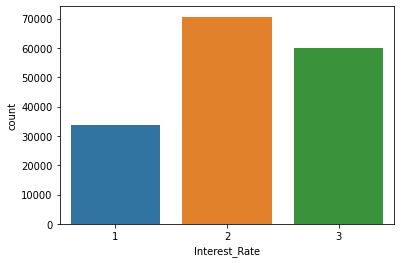

In [13]:
#Checking for imbalance 
sns.countplot(train_data['Interest_Rate'])
plt.show()

In [14]:
#Filling the missing value of Months_Since_Deliquency by "No" 
#(Assumption: I am assuming that the values are missing because customer never deliqued
train_data['Months_Since_Deliquency'].fillna('No',inplace=True)

In [15]:
len(train_data.columns)

14

In [16]:
#Dropping the rows which have more that 1 missing value
train_data = train_data.dropna(thresh=len(train_data.columns)-1) # means thresh 13 means atleast 13 values in rows

# Number_Open_Accounts

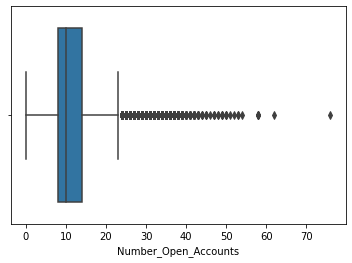

In [17]:
sns.boxplot('Number_Open_Accounts',data=train_data)
plt.show()

In [18]:
#calculating number of acoounts at each percntile 0,10,20,30,40,50,60,70,80,90,100
for i in range(0,100,10):
    var =train_data["Number_Open_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0
10 percentile value is 6
20 percentile value is 7
30 percentile value is 8
40 percentile value is 9
50 percentile value is 10
60 percentile value is 12
70 percentile value is 13
80 percentile value is 15
90 percentile value is 18
100 percentile value is  76


In [19]:
#calculating number of acoounts at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =train_data["Number_Open_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 18
91 percentile value is 18
92 percentile value is 19
93 percentile value is 19
94 percentile value is 20
95 percentile value is 21
96 percentile value is 21
97 percentile value is 23
98 percentile value is 24
99 percentile value is 27
100 percentile value is  76


In [20]:
#calculating number of acoounts at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =train_data["Number_Open_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 27
99.1 percentile value is 27
99.2 percentile value is 27
99.3 percentile value is 28
99.4 percentile value is 29
99.5 percentile value is 29
99.6 percentile value is 30
99.7 percentile value is 31
99.8 percentile value is 33
99.9 percentile value is 36
100 percentile value is  76


In [21]:
#calculating number of acoounts at each percntile 99.90,99.91,99.92,99.93,99.94,99.95,99.96,99.97,99.98,99.99,100
for i in np.arange(0.0, 0.1, 0.01):
    var =train_data["Number_Open_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99.9+i,var[int(len(var)*(float(99.9+i)/100))]))
print("100 percentile value is ",var[-1])

99.9 percentile value is 36
99.91000000000001 percentile value is 37
99.92 percentile value is 37
99.93 percentile value is 38
99.94000000000001 percentile value is 38
99.95 percentile value is 39
99.96000000000001 percentile value is 40
99.97 percentile value is 42
99.98 percentile value is 43
99.99000000000001 percentile value is 49
100 percentile value is  76


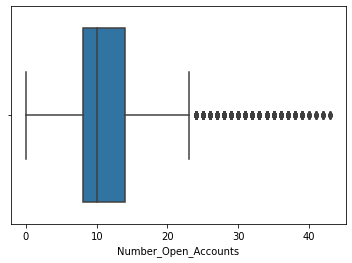

In [22]:
#To remove the outliers We are taking threshhold of 43
train_data = train_data[train_data['Number_Open_Accounts']<=43]
sns.boxplot('Number_Open_Accounts',data=train_data)
plt.show()

In [23]:
train_data.shape

(158432, 14)

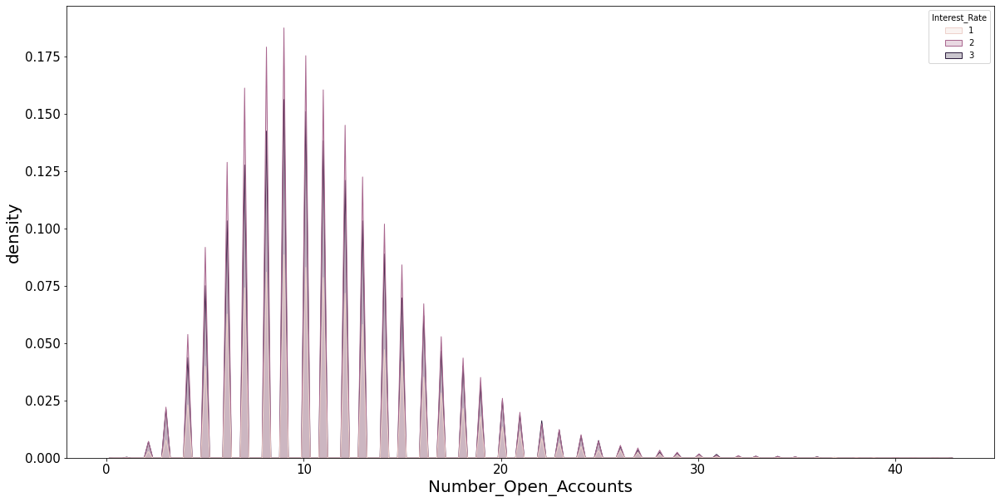

In [24]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Number_Open_Accounts',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Number_Open_Accounts',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

# Total Accounts

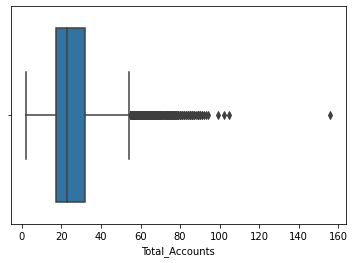

In [25]:
sns.boxplot('Total_Accounts',data=train_data)
plt.show()

In [26]:
#calculating number of accounts each percntile 0,10,20,30,40,50,60,70,80,90,100
for i in range(0,100,10):
    var =train_data["Total_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 2
10 percentile value is 12
20 percentile value is 15
30 percentile value is 18
40 percentile value is 21
50 percentile value is 23
60 percentile value is 26
70 percentile value is 30
80 percentile value is 34
90 percentile value is 41
100 percentile value is  156


In [27]:
#calculating number of acoounts each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100,1):
    var =train_data["Total_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 41
91 percentile value is 42
92 percentile value is 43
93 percentile value is 44
94 percentile value is 45
95 percentile value is 47
96 percentile value is 48
97 percentile value is 51
98 percentile value is 54
99 percentile value is 59
100 percentile value is  156


In [28]:
#calculating number of acoounts each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0,1.0,0.1):
    var =train_data["Total_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 59
99.1 percentile value is 60
99.2 percentile value is 61
99.3 percentile value is 61
99.4 percentile value is 62
99.5 percentile value is 63
99.6 percentile value is 63
99.7 percentile value is 63
99.8 percentile value is 65
99.9 percentile value is 71
100 percentile value is  156


In [29]:
#calculating number of acoounts at each percntile 99.90,99.91,99.92,99.93,99.94,99.95,99.96,99.97,99.98,99.99,100
for i in np.arange(0.0, 0.1, 0.01):
    var =train_data["Total_Accounts"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99.9+i,var[int(len(var)*(float(99.9+i)/100))]))
print("100 percentile value is ",var[-1])

99.9 percentile value is 71
99.91000000000001 percentile value is 72
99.92 percentile value is 74
99.93 percentile value is 74
99.94000000000001 percentile value is 76
99.95 percentile value is 77
99.96000000000001 percentile value is 78
99.97 percentile value is 80
99.98 percentile value is 85
99.99000000000001 percentile value is 89
100 percentile value is  156


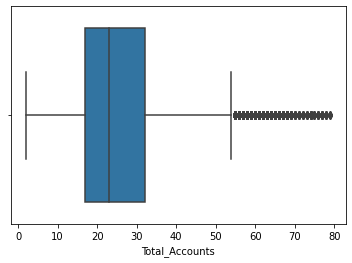

In [30]:
#To remove the outliers We are taking threshhold of 80
train_data = train_data[train_data['Total_Accounts']<80]
sns.boxplot('Total_Accounts',data=train_data)
plt.show()

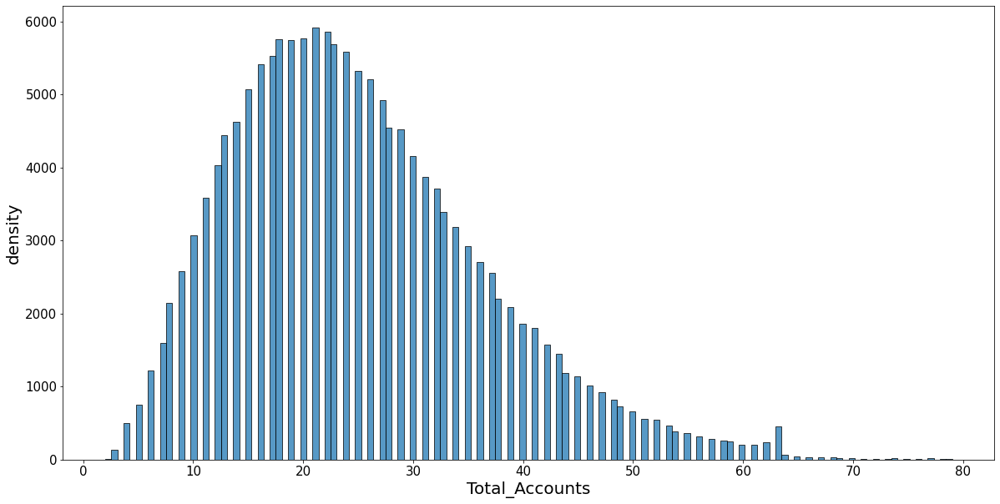

In [31]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Total_Accounts')
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Total_Accounts',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

# Loan_Amount_Requested

In [32]:
#Loan_Amount_Requested:  To remove " , " & converting to int value

train_data['Loan_Amount_Requested'] = train_data['Loan_Amount_Requested'].apply(lambda x:re.sub(',','',x))
train_data['Loan_Amount_Requested'] = train_data['Loan_Amount_Requested'].astype(int)

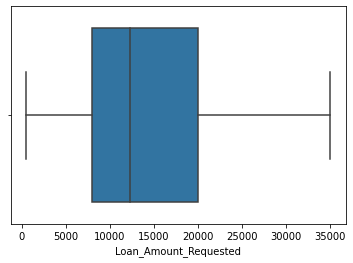

In [33]:
sns.boxplot('Loan_Amount_Requested',data=train_data)
plt.show()

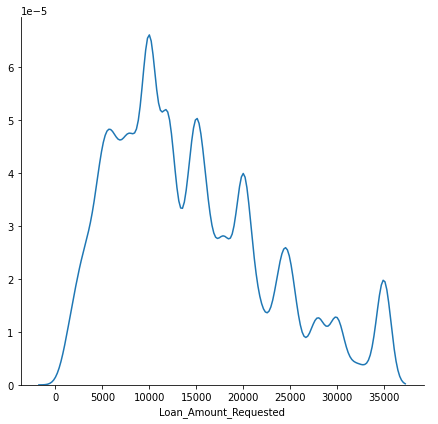

In [34]:
#pdf of Loan_Amount_Requested
sns.FacetGrid(train_data,size=6) \
      .map(sns.kdeplot,"Loan_Amount_Requested") \
      .add_legend();
plt.show();

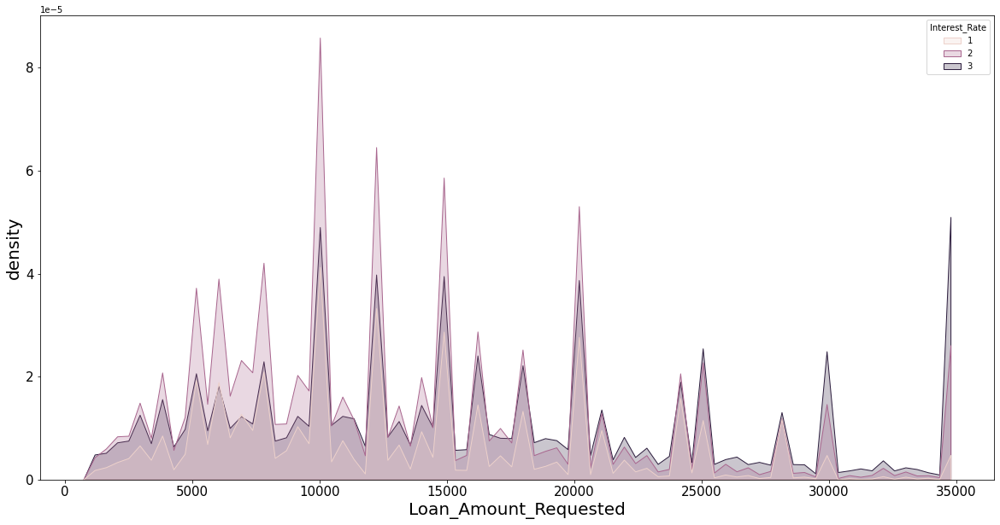

In [35]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Loan_Amount_Requested',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Loan_Amount_Requested',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

# Annual_Income

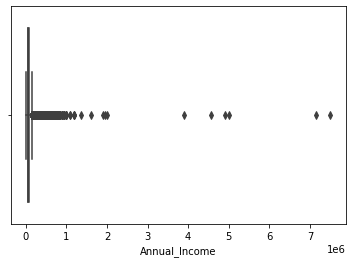

In [36]:
sns.boxplot('Annual_Income',data=train_data)
plt.show()

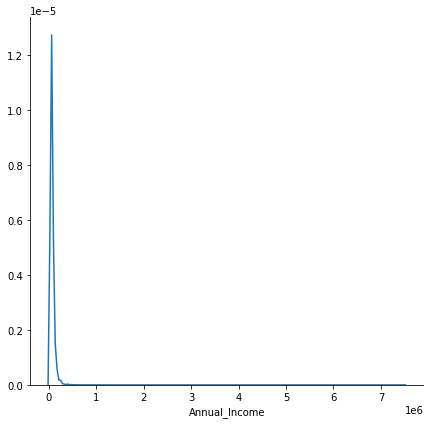

In [37]:
#pdf of Annual_Income
sns.FacetGrid(train_data,size=6) \
      .map(sns.kdeplot,"Annual_Income") \
      .add_legend();
plt.show();

In [38]:
print("Total missing values in  Annual_Income = {} ".format(train_data['Annual_Income'].isnull().sum()))

Total missing values in  Annual_Income = 20233 


In [39]:
median = train_data['Annual_Income'].median()
print("Median of Annual_Income = {}".format(median))

Median of Annual_Income = 63000.0


In [40]:
#Fiiling the missing value byb median
train_data['Annual_Income'].fillna(median,inplace=True)

In [41]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var =train_data["Annual_Income"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is 4000.0
10 percentile value is 35000.0
20 percentile value is 44000.0
30 percentile value is 51200.0
40 percentile value is 60000.0
50 percentile value is 63000.0
60 percentile value is 65500.0
70 percentile value is 76914.8
80 percentile value is 90000.0
90 percentile value is 116000.0
100 percentile value is  7500000.0


In [42]:
#looking further from the 90th percecntile
for i in range(90,100):
    var =train_data["Annual_Income"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 116000.0
91 percentile value is 120000.0
92 percentile value is 125000.0
93 percentile value is 130000.0
94 percentile value is 135000.0
95 percentile value is 144000.0
96 percentile value is 150000.0
97 percentile value is 165000.0
98 percentile value is 185000.0
99 percentile value is 230000.0
100 percentile value is  7500000.0


In [43]:
train_data[train_data['Annual_Income']<=185000.0]

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,7000,< 1 year,Rent,68000.0,not verified,car,18.37,0,No,9,14,Female,1
1,10000002,30000,4 years,Mortgage,63000.0,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3
2,10000003,24725,7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,No,12,16,Male,3
3,10000004,16000,< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,No,16,22,Male,3
4,10000005,17000,8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,No,19,30,Female,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,10164305,20725,10+ years,Rent,63000.0,VERIFIED - income source,credit_card,13.56,0,No,13,16,Male,2
164305,10164306,6000,8 years,Own,63000.0,VERIFIED - income source,small_business,9.12,0,36.0,13,30,Male,2
164306,10164307,20250,10+ years,Mortgage,63000.0,VERIFIED - income,credit_card,18.17,1,No,17,30,Male,1
164307,10164308,10000,4 years,Rent,63000.0,not verified,major_purchase,18.75,1,48.0,16,62,Female,3


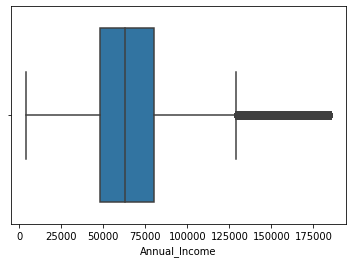

In [44]:
#To remove the outliers We are taking threshhold of 185000[98th %tile]
train_data = train_data[train_data['Annual_Income']<=185000.0]
sns.boxplot('Annual_Income',data=train_data)
plt.show()

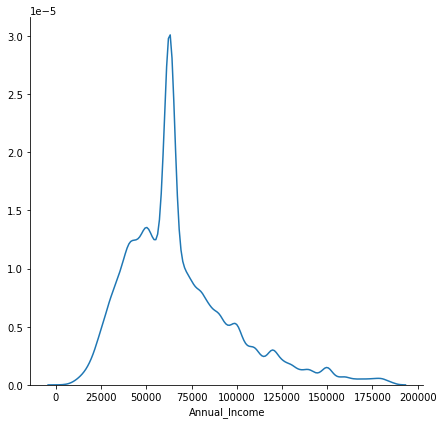

In [45]:
#pdf of Annual_Income
sns.FacetGrid(train_data,size=6) \
      .map(sns.kdeplot,"Annual_Income") \
      .add_legend();
plt.show();

In [46]:
#converting the values to log-values to chec for log-normal
import math
train_data['log_Income']=[math.log(i) for i in train_data['Annual_Income'].values]

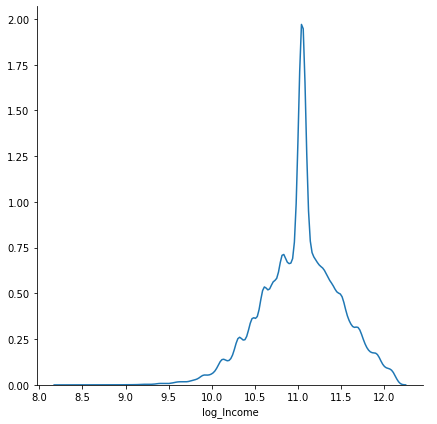

In [47]:
#pdf of log-values
sns.FacetGrid(train_data,size=6) \
      .map(sns.kdeplot,"log_Income") \
      .add_legend();
plt.show();

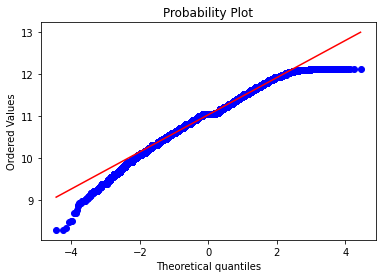

In [48]:
#Q-Q plot for checking if Income is log-normal
scipy.stats.probplot(train_data['log_Income'].values, plot=plt)
plt.show()

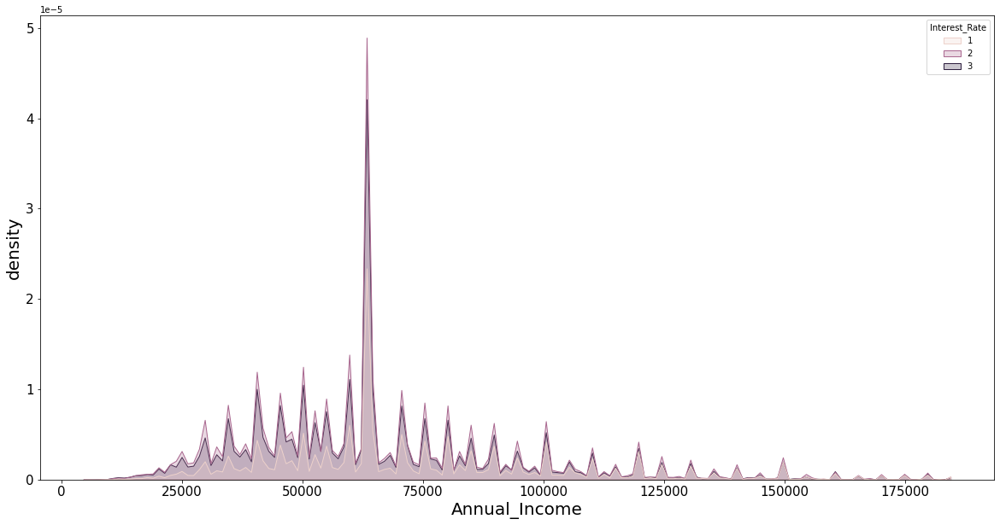

In [49]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Annual_Income',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Annual_Income',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

Months_Since_Deliquency
-----------

In [50]:
print("Total missing values in  Months_Since_Deliquency = {} ".format(train_data['Months_Since_Deliquency'].isna().sum()))

Total missing values in  Months_Since_Deliquency = 0 


In [51]:
# Converting Months_Since_Deliquency to bollean(0/1)
#1 = Deliquency
#0 = No Deliquency


function = lambda x: 1 if x != 'No' else 0
train_data['Months_Since_Deliquency'] = train_data['Months_Since_Deliquency'].apply(function)



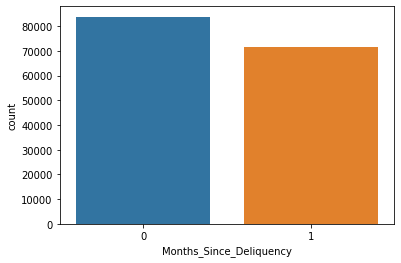

In [52]:
sns.countplot(train_data['Months_Since_Deliquency'])
plt.show()

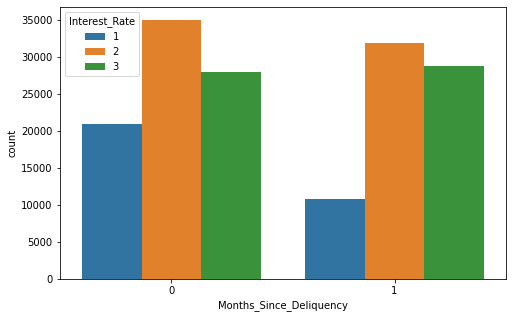

In [53]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(8,5))
sns.countplot('Months_Since_Deliquency',hue='Interest_Rate',data=train_data)
plt.show()

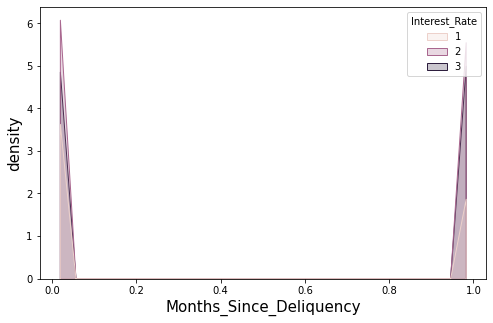

In [54]:
plt.figure(figsize=(8,5))
sns.histplot(data=train_data,x='Months_Since_Deliquency',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=10,rotation=0)
plt.yticks(size=10)
plt.xlabel('Months_Since_Deliquency',fontsize=15)
plt.ylabel('density',fontsize=15)
plt.show()

Income_Verified
--------

In [55]:
print("Total missing values in  Income_Verified = {} ".format(train_data['Income_Verified'].isna().sum()))

Total missing values in  Income_Verified = 0 


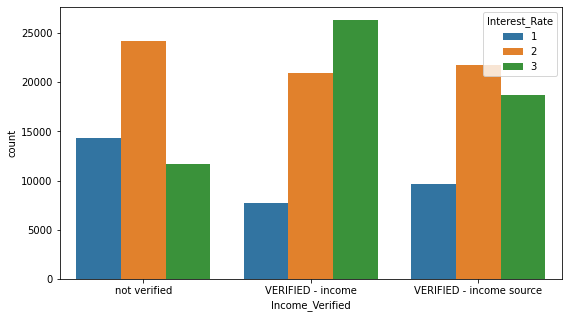

In [56]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(9,5))
sns.countplot('Income_Verified',hue='Interest_Rate',data=train_data)
plt.show()

# Purpose_Of_Loan

In [57]:
print("Total missing values in  Purpose_Of_Loan = {} ".format(train_data['Purpose_Of_Loan'].isna().sum()))

Total missing values in  Purpose_Of_Loan = 0 


In [58]:
print("Total unique Purposes =", train_data['Purpose_Of_Loan'].nunique())

Total unique Purposes = 14


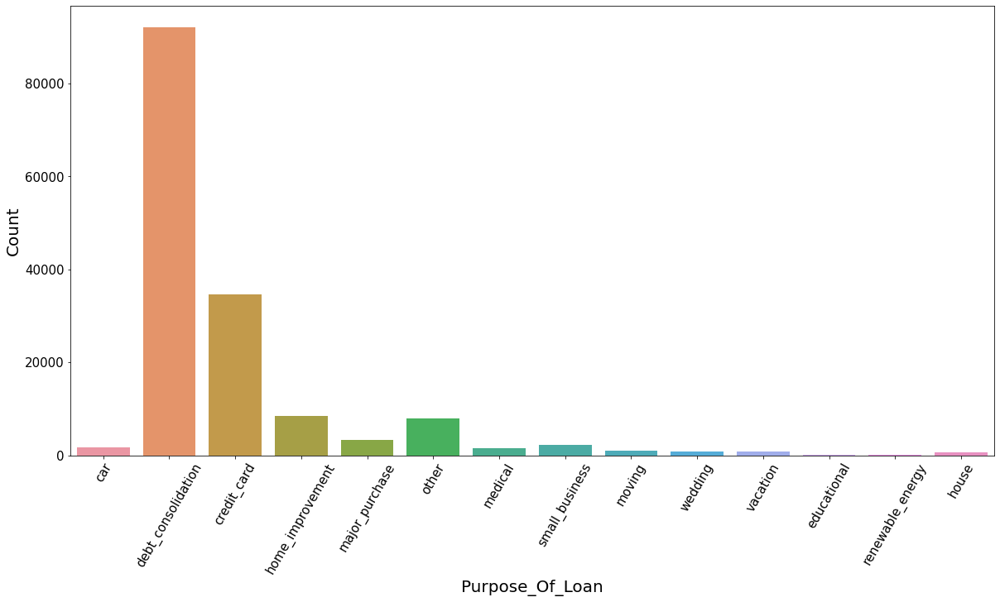

In [59]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(20,10))
sns.countplot('Purpose_Of_Loan',data=train_data)
plt.xticks(size=15,rotation=60)
plt.yticks(size=15)
plt.xlabel('Purpose_Of_Loan',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()

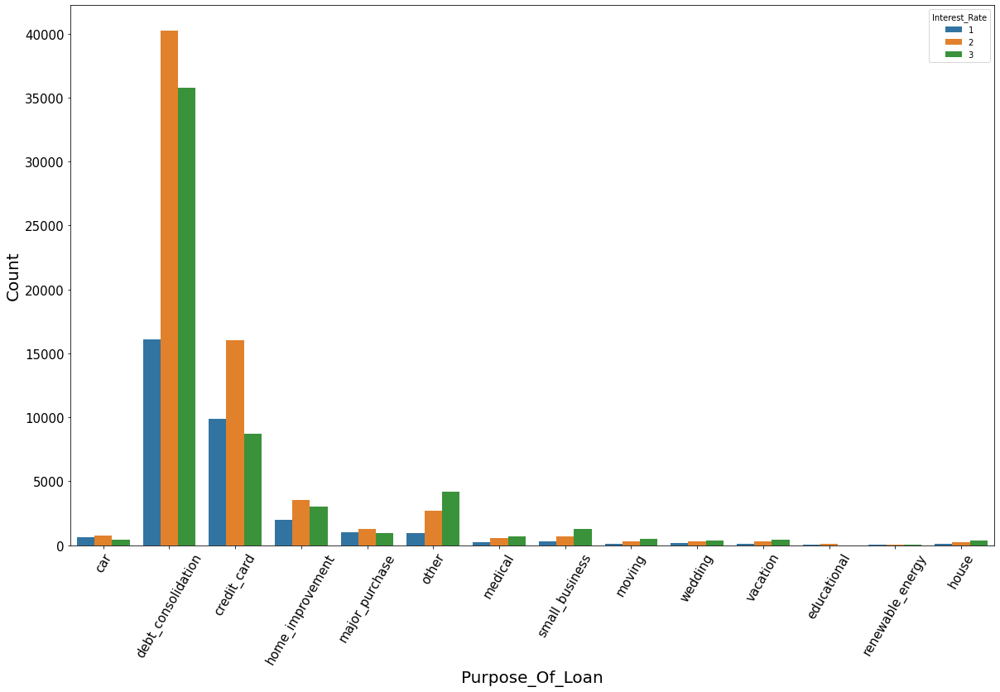

In [60]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(20,12))
sns.countplot('Purpose_Of_Loan',hue='Interest_Rate',data=train_data)
plt.xticks(size=15,rotation=60)
plt.yticks(size=15)
plt.xlabel('Purpose_Of_Loan',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()

In [61]:
group_Purpose_Of_Loan = train_data.groupby('Purpose_Of_Loan')


In [62]:
#Mean for every purpose
group_Purpose_Of_Loan.median()[['Loan_Amount_Requested','Annual_Income','Debt_To_Income',
                                'Interest_Rate','Number_Open_Accounts','Total_Accounts']]

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Interest_Rate,Number_Open_Accounts,Total_Accounts
Purpose_Of_Loan,,,,,,
car,6000,61789.0,12.500,2.0,9.0,20.0
credit_card,12800,63000.0,17.180,2.0,11.0,23.0
debt_consolidation,14000,63000.0,17.650,2.0,11.0,24.0
educational,6000,50000.0,11.500,2.0,8.0,16.0
home_improvement,11500,65000.0,13.900,2.0,10.0,24.0
house,13000,63000.0,13.015,3.0,9.0,21.0
major_purchase,8000,63000.0,12.955,2.0,9.0,20.0
medical,6800,63000.0,15.950,2.0,10.0,22.0
moving,5000,60000.0,14.680,3.0,9.0,20.0


In [63]:
#Median for every purpose
group_Purpose_Of_Loan.mean()

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate,log_Income
Purpose_Of_Loan,,,,,,,,,,
car,1.008323e+07,7977.034560,62361.758846,13.632224,0.862876,0.406355,9.399666,21.615385,1.887960,10.931065
credit_card,1.008238e+07,14621.370432,67662.854567,17.616544,0.694597,0.421953,11.424291,24.891445,1.966547,11.026023
debt_consolidation,1.008219e+07,15015.249397,68001.649371,17.980462,0.765771,0.470565,11.401077,25.490402,2.213752,11.036178
educational,1.008340e+07,7123.739496,53677.357479,11.502521,1.100840,0.394958,9.042017,18.117647,1.747899,10.688809
home_improvement,1.008190e+07,13542.289911,75309.073151,14.532656,0.971910,0.514630,10.577598,25.330758,2.116222,11.136417
house,1.008209e+07,14769.777159,71065.437688,13.604401,1.193593,0.484680,9.889972,23.371866,2.334262,11.067751
major_purchase,1.008207e+07,10224.411035,66918.104950,13.747601,0.870738,0.421265,9.672970,21.831680,1.980781,11.002004
medical,1.008123e+07,8793.806228,66287.953114,16.205488,0.814533,0.479585,10.184775,24.020761,2.336332,10.992145
moving,1.008161e+07,7315.973742,61561.144464,15.456466,0.865427,0.455142,9.838074,21.318381,2.444201,10.913703


In [64]:
car = train_data[(train_data['Purpose_Of_Loan']=='car')]
car_ir = car.groupby('Interest_Rate')
car_ir.mean()

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,log_Income
Interest_Rate,,,,,,,,,
1,1.008226e+07,7236.974110,68376.421974,11.805243,0.626214,0.276699,9.762136,23.048544,11.034835
2,1.008423e+07,7696.047431,60195.158538,14.428735,0.922266,0.458498,9.386034,21.699605,10.899038
3,1.008285e+07,9585.251799,57391.465851,14.890072,1.105516,0.503597,8.887290,19.338129,10.835569


Length_Employed 
------------

In [65]:
print("Total missing values in  Length_Employed = {} ".format(train_data['Length_Employed'].isna().sum()))

Total missing values in  Length_Employed = 5231 


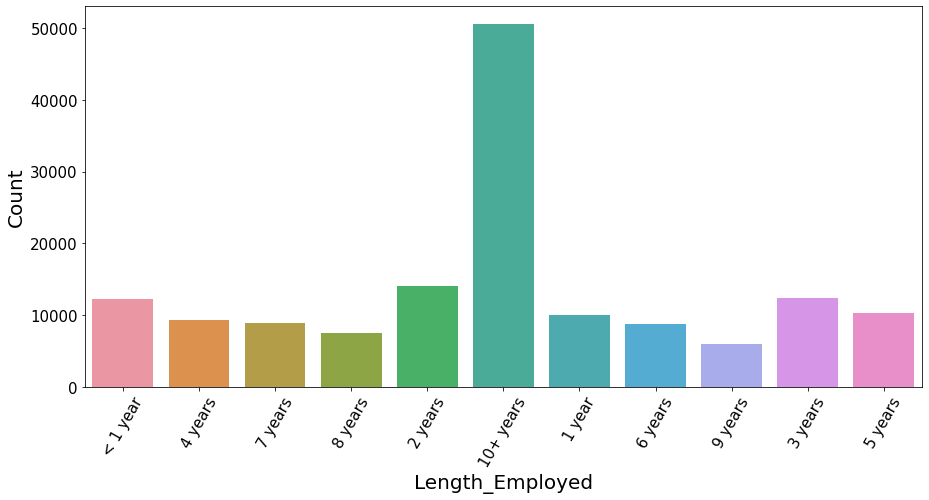

In [66]:

#Plotting the bar graph check the variation 
plt.figure(figsize=(15,7))
sns.countplot('Length_Employed',data=train_data)
plt.xticks(size=15,rotation=60)
plt.yticks(size=15)
plt.xlabel('Length_Employed',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()

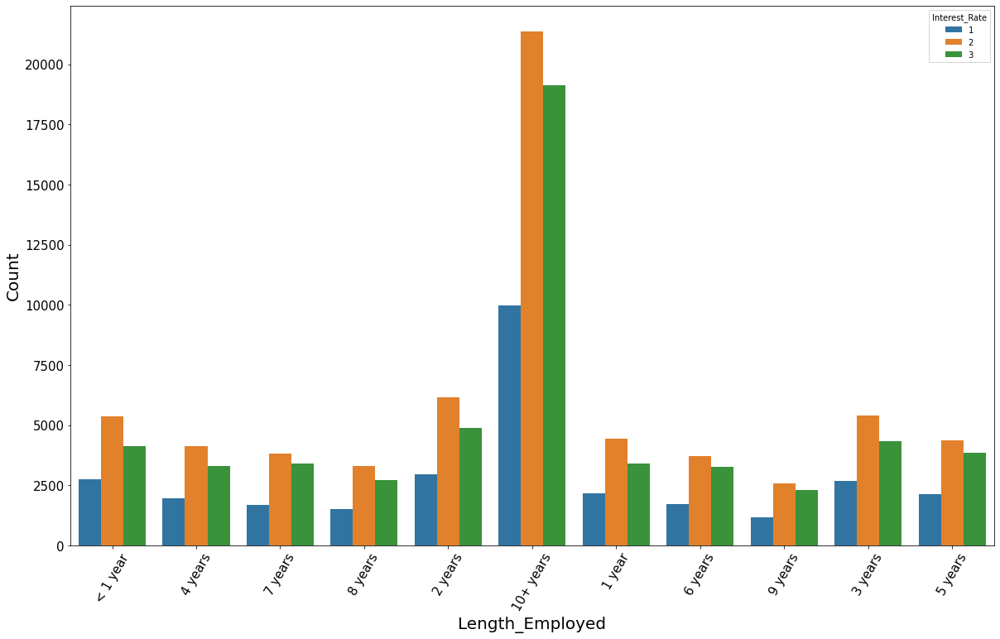

In [67]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(20,12))
sns.countplot('Length_Employed',hue='Interest_Rate',data=train_data)
plt.xticks(size=15,rotation=60)
plt.yticks(size=15)
plt.xlabel('Length_Employed',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()

In [68]:
#Filling the missing value by 0 #Assumption: Values are missing because they never employeed 
train_data['Length_Employed'].fillna(0,inplace=True)


#Converting the values into interger
function = lambda x: 1000 if x == '< 1 year' else x
train_data['Length_Employed'] = train_data['Length_Employed'].apply(function)

function = lambda x: re.search(r'\d+', x).group() if re.search(r'\d+', x) else x
train_data['Length_Employed'] = train_data['Length_Employed'].apply(str).apply(function)

function = lambda x: 0.5 if x == '1000' else x
train_data['Length_Employed'] = train_data['Length_Employed'].apply(function)

train_data['Length_Employed'] = train_data['Length_Employed'].astype(float)

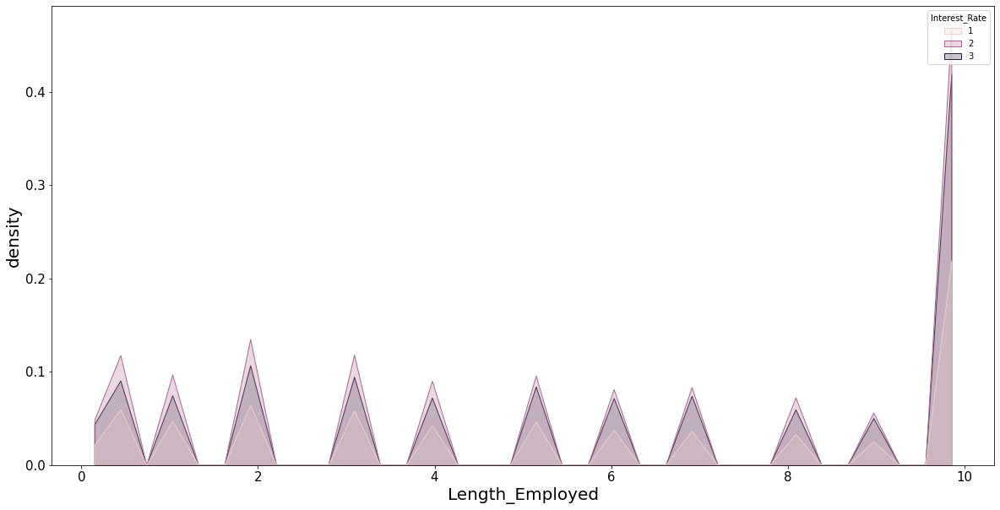

In [69]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Length_Employed',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Length_Employed',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

Home_owner
------------

In [70]:
print("Total missing values in  Home_Owner = {} ".format(train_data['Home_Owner'].isna().sum()))

Total missing values in  Home_Owner = 19981 


In [71]:
print("type of Home_Owner = ",train_data['Home_Owner'].unique())

type of Home_Owner =  ['Rent' 'Mortgage' nan 'Own' 'Other' 'None']


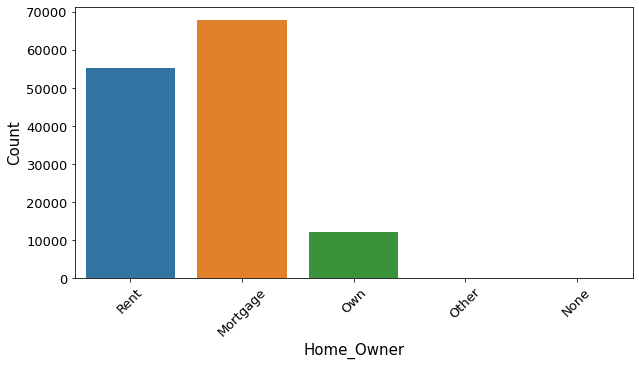

In [72]:

#Plotting the bar graph check the variation 
plt.figure(figsize=(10,5))
sns.countplot('Home_Owner',data=train_data)
plt.xticks(size=13,rotation=45)
plt.yticks(size=13)
plt.xlabel('Home_Owner',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

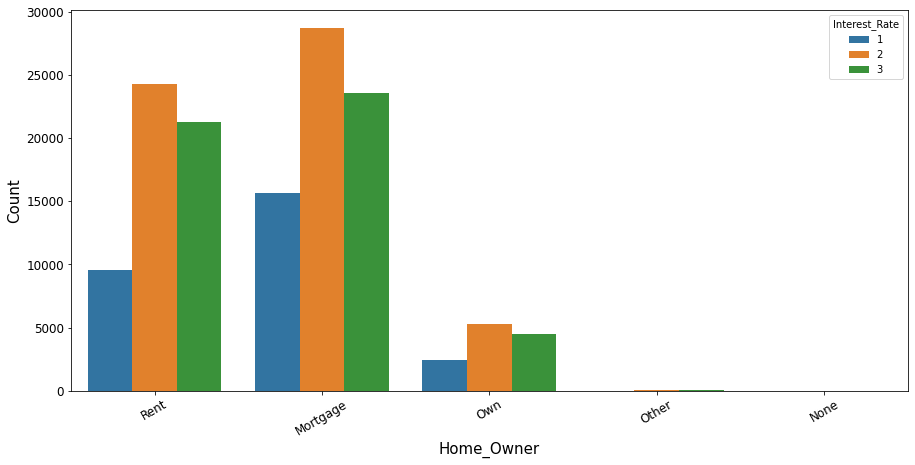

In [73]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(15,7))
sns.countplot('Home_Owner',hue='Interest_Rate',data=train_data)
plt.xticks(size=12,rotation=30)
plt.yticks(size=12)
plt.xlabel('Home_Owner',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

In [74]:
count = train_data[train_data['Home_Owner']== "Other"].shape[0] + train_data[train_data['Home_Owner']== "None"].shape[0]
print("""Total "other" and "None" values =""",count)

Total "other" and "None" values = 58


In [75]:
#converting "None" & missing values to "Other" category

train_data['Home_Owner'] = train_data['Home_Owner'].apply(lambda x: "Other" if x=="None" else x)
train_data['Home_Owner'] = train_data['Home_Owner'].fillna("Other")

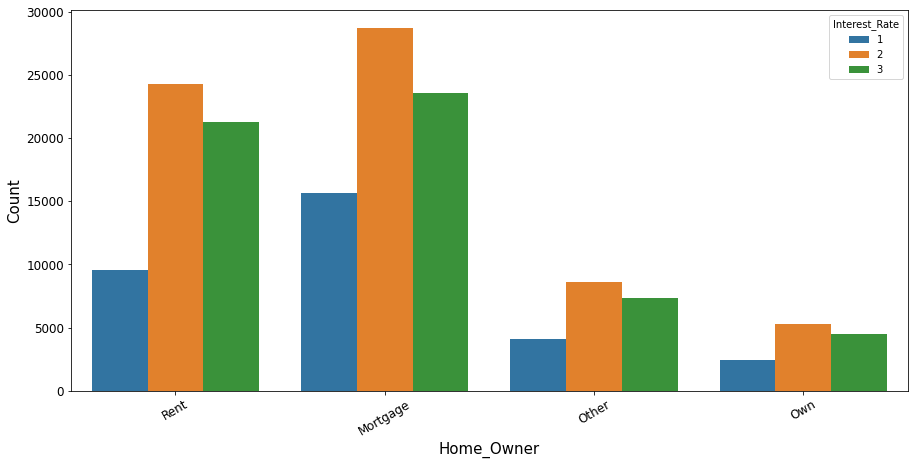

In [76]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(15,7))
sns.countplot('Home_Owner',hue='Interest_Rate',data=train_data)
plt.xticks(size=12,rotation=30)
plt.yticks(size=12)
plt.xlabel('Home_Owner',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

Inquiries_Last_6Mo
---------------

In [77]:
print("Total missing values in  Inquiries_Last_6Mo = {} ".format(train_data['Inquiries_Last_6Mo'].isna().sum()))

Total missing values in  Inquiries_Last_6Mo = 0 


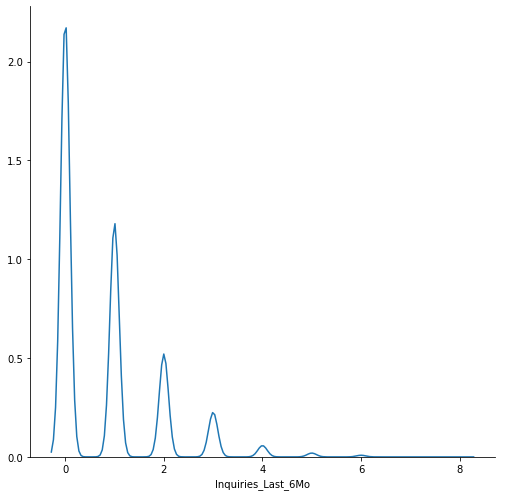

In [78]:
#pdf of Annual_Income
sns.FacetGrid(train_data,size=7) \
      .map(sns.kdeplot,"Inquiries_Last_6Mo") \
      .add_legend();
plt.show();

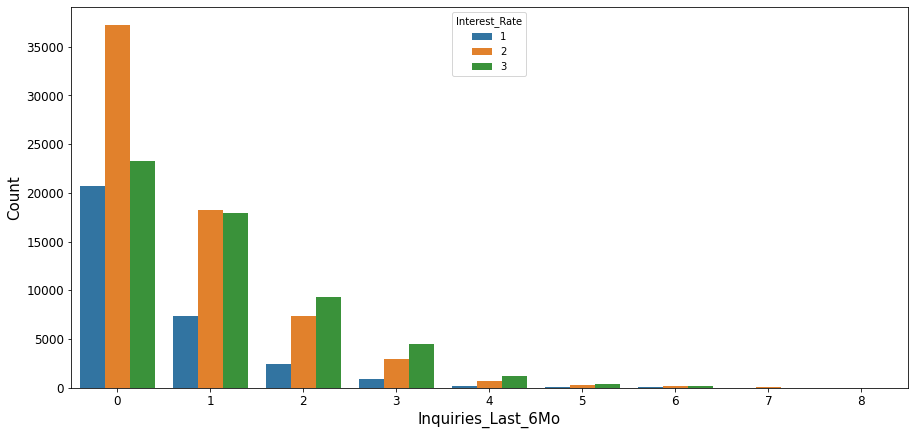

In [79]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(15,7))
sns.countplot('Inquiries_Last_6Mo',hue='Interest_Rate',data=train_data)
plt.xticks(size=12,rotation=0)
plt.yticks(size=12)
plt.xlabel('Inquiries_Last_6Mo',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

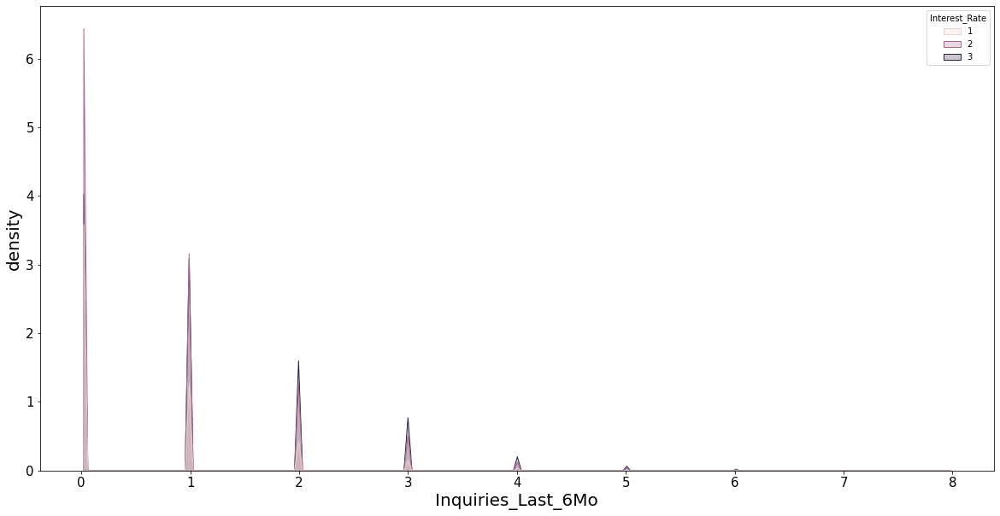

In [80]:
plt.figure(figsize=(20,10))
sns.histplot(data=train_data,x='Inquiries_Last_6Mo',hue='Interest_Rate', element="poly",stat="density")
plt.xticks(size=15,rotation=0)
plt.yticks(size=15)
plt.xlabel('Inquiries_Last_6Mo',fontsize=20)
plt.ylabel('density',fontsize=20)
plt.show()

# Gender

In [81]:
print("Total missing values in  Gender = {} ".format(train_data['Gender'].isna().sum()))

Total missing values in  Gender = 0 


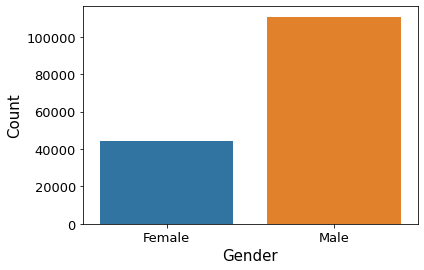

In [82]:
#Plotting the bar graph check the variation 
#plt.figure(figsize=(10,5))
sns.countplot('Gender',data=train_data)
plt.xticks(size=13,rotation=0)
plt.yticks(size=13)
plt.xlabel('Gender',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

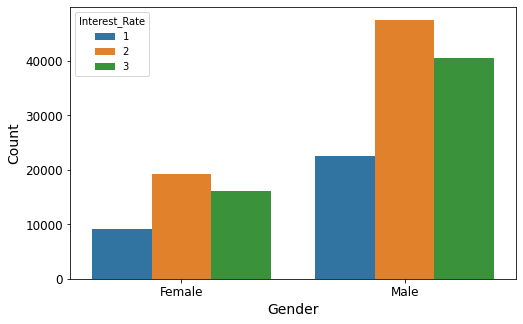

In [83]:
#Plotting the bar graph check the variation 
plt.figure(figsize=(8,5))
sns.countplot('Gender',hue='Interest_Rate',data=train_data)
plt.xticks(size=12,rotation=0)
plt.yticks(size=12)
plt.xlabel('Gender',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.show()

<Figure size 1440x864 with 0 Axes>

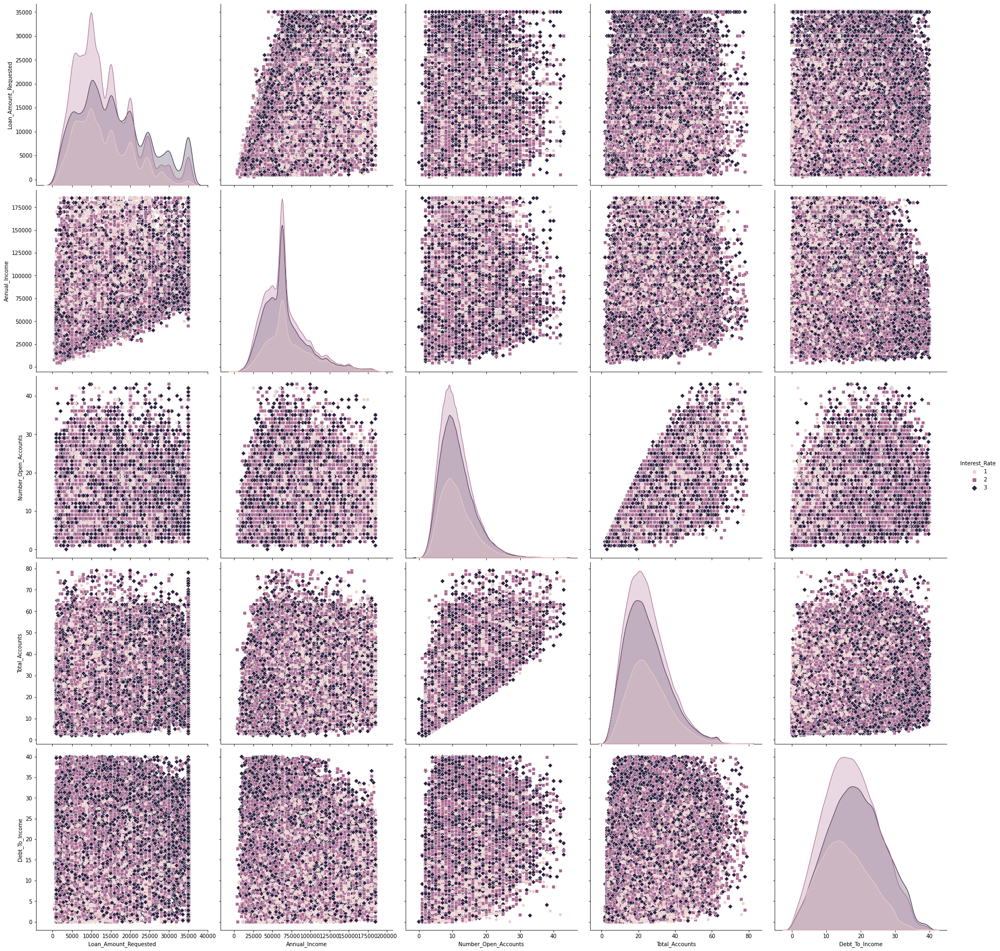

In [84]:
plt.figure(figsize=(20,12))
sns.pairplot(train_data[['Loan_Amount_Requested','Annual_Income','Number_Open_Accounts','Total_Accounts',
                         'Debt_To_Income','Interest_Rate']],hue='Interest_Rate',markers=["o", "s", "D"],height=5)
plt.xticks(size=12,rotation=25)
plt.yticks(size=12)
#plt.xlabel('Gender',fontsize=14)
#plt.ylabel('Count',fontsize=14)
plt.show()

Creating New_features
------------

In [85]:
train_data['total_debt'] = train_data['Debt_To_Income']*train_data['Annual_Income']

train_data['open_acc_to_total_acc'] = train_data['Number_Open_Accounts']/train_data['Total_Accounts']

train_data['loan_amount_to_annual_income'] = train_data["Loan_Amount_Requested"]/train_data['Annual_Income']

train_data['total_salary'] = train_data['Length_Employed']*train_data['Annual_Income']

train_data['loan_amount_to_total_debt'] = train_data['Loan_Amount_Requested']/(train_data['total_debt']+1)

train_data['anuual_income_to_open_acc'] = train_data['Annual_Income']/(train_data['Number_Open_Accounts']+1)

train_data['anuual_income_to_total_acc'] = train_data['Annual_Income']/train_data['Total_Accounts']

train_data['total_debt_to_opn_acc'] = train_data['total_debt']/train_data['Number_Open_Accounts']

train_data['total_debt_to_total_acc'] = train_data['total_debt']/train_data['Total_Accounts']

train_data['total_earnings'] = train_data['Length_Employed']*train_data['Annual_Income']

In [86]:
train_data.describe()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate,...,total_debt,open_acc_to_total_acc,loan_amount_to_annual_income,total_salary,loan_amount_to_total_debt,anuual_income_to_open_acc,anuual_income_to_total_acc,total_debt_to_opn_acc,total_debt_to_total_acc,total_earnings
count,1.552700e+05,155270.000000,155270.000000,155270.000000,155270.000000,155270.000000,155270.000000,155270.000000,155270.000000,155270.000000,...,1.552700e+05,155270.000000,155270.000000,1.552700e+05,155270.000000,155270.000000,155270.000000,1.552680e+05,155270.000000,1.552700e+05
mean,1.008217e+07,14198.946029,5.826399,67970.093893,17.315098,0.776544,0.460224,11.157642,24.918407,2.161171,...,1.135644e+06,0.486173,0.222868,4.111196e+05,6.680425,6336.118477,3251.202698,1.097564e+05,50381.566847,4.111196e+05
std,4.741344e+04,8156.028818,3.667801,30274.533323,7.820471,1.029900,0.498417,4.937488,11.455081,0.737045,...,6.673278e+05,0.172620,0.113321,3.387812e+05,312.960024,3721.330107,2149.715431,6.561914e+04,30924.302052,3.387812e+05
min,1.000000e+07,500.000000,0.000000,4000.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,...,0.000000e+00,0.000000,0.006471,0.000000e+00,0.000301,250.000000,95.238095,0.000000e+00,0.000000,0.000000e+00
25%,1.004114e+07,8000.000000,2.000000,48000.000000,11.510000,0.000000,0.000000,8.000000,16.000000,2.000000,...,6.589800e+05,0.360000,0.133571,1.260000e+05,0.008195,3888.888889,1918.665056,6.454767e+04,29320.000000,1.260000e+05
50%,1.008220e+07,12000.000000,6.000000,63000.000000,16.970000,0.000000,0.000000,10.000000,23.000000,2.000000,...,1.030700e+06,0.466667,0.208696,3.500000e+05,0.012787,5461.538462,2727.272727,9.744000e+04,44401.622718,3.500000e+05
75%,1.012322e+07,20000.000000,10.000000,80376.000000,22.870000,1.000000,1.000000,14.000000,32.000000,3.000000,...,1.487000e+06,0.592593,0.300000,6.300000e+05,0.019609,7857.142857,3937.500000,1.402679e+05,64351.669091,6.300000e+05
max,1.016431e+07,35000.000000,10.000000,185000.000000,39.990000,8.000000,1.000000,43.000000,79.000000,3.000000,...,6.575400e+06,1.000000,0.821429,1.850000e+06,32000.000000,92500.000000,68087.000000,1.957253e+06,489313.125000,1.850000e+06


# Models

In [87]:
#To_Evalute_the_Model
def classification_model_evaluation(model,x_train,y_train,x_test,y_test):
    print("####################### model Evalution started #######################")
    train_pre = model.predict(x_train)
    test_pre = model.predict(x_test)
    train_pro = model.predict_proba(x_train)
    test_pro = model.predict_proba(x_test)

    print("Train Accuracy: {0} \t Test Accuracy: {1}".format(accuracy_score(y_train, train_pre),accuracy_score(y_test,test_pre)))
    print("Train Log Loss: {0} \t Test Log Loss: {1}".format(log_loss(y_train, train_pro),log_loss(y_test,test_pro)))
    print("Train AUC: {0} \t\t Test AUC: {1}".format(roc_auc_score(y_train, train_pro,multi_class='ovo'),roc_auc_score(y_test,test_pro,multi_class='ovo')))
    print("Train F1: {0} \t\t Test F1: {1}".format(f1_score(y_train, train_pre,average='weighted'),f1_score(y_test,test_pre,average='weighted')))
    print("Train recall: {0} \t Test recall: {1}".format(recall_score(y_train, train_pre,average='weighted'),recall_score(y_test,test_pre,average='weighted')))
    print("Train precision: {0} \t Test Precision: {1}".format(precision_score(y_train, train_pre,average='weighted'),precision_score(y_test,test_pre,average='weighted')))
    print()
    print("Train Classification report: \n{0} \n Test classification report: \n{1}".format(classification_report(y_train, train_pre),classification_report(y_test,test_pre)))
    
    
    print()
    print()
    print()
    print("="*25,"Train Set","="*25)
    print()
    titles_options = [("Train set Confusion matrix, without normalization", None),
                  ("Train set Normalized confusion matrix by all", 'all'),
                  ("Train set Normalized confusion matrix by pred(Columns)", 'pred'),
                  ("Train set Normalized confusion matrix by true(Rows)", 'true')]
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(model, x_train, y_train,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
        disp.ax_.set_title(title)
    plt.show()
    
    print()
    print()
    print()
    print("="*25,"Test Set","="*30)
    print()
    titles_options = [("Test Set Confusion matrix, without normalization", None),
                  ("Test Set Normalized confusion matrix by all", 'all'),
                  ("Test Set Normalized confusion matrix by pred(Columns)", 'pred'),
                  ("Test Set Normalized confusion matrix by true(Rows)", 'true')]
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(model, x_test, y_test,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
        disp.ax_.set_title(title)

    plt.show()


In [88]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155270 entries, 0 to 164308
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Loan_ID                       155270 non-null  int64  
 1   Loan_Amount_Requested         155270 non-null  int32  
 2   Length_Employed               155270 non-null  float64
 3   Home_Owner                    155270 non-null  object 
 4   Annual_Income                 155270 non-null  float64
 5   Income_Verified               155270 non-null  object 
 6   Purpose_Of_Loan               155270 non-null  object 
 7   Debt_To_Income                155270 non-null  float64
 8   Inquiries_Last_6Mo            155270 non-null  int64  
 9   Months_Since_Deliquency       155270 non-null  int64  
 10  Number_Open_Accounts          155270 non-null  int64  
 11  Total_Accounts                155270 non-null  int64  
 12  Gender                        155270 non-nul

In [89]:
Data =  pd.get_dummies(train_data,drop_first=True)
Data.drop(columns=['Loan_ID','Annual_Income'],inplace=True)

In [90]:

#Scaling the features into range of 0 to 1

cols = list(Data.columns)
cols.remove('Interest_Rate')

scaler = MinMaxScaler() 
scaler.fit(Data.drop(columns=['Interest_Rate']))
Scaled_data = scaler.transform(Data.drop(columns=['Interest_Rate']))
Scaled_data = pd.DataFrame(Scaled_data,columns=cols)
                                                 


In [91]:
#Dividing into train(80%) and validation data(20%)
x_train,x_test,y_train,y_test = train_test_split(Scaled_data,Data["Interest_Rate"], test_size = 0.2,random_state=1)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5487376827461841 	 Test Accuracy: 0.5326205963804985
Train Log Loss: 0.9164951855261472 	 Test Log Loss: 0.933775592818768
Train AUC: 0.7358623788116235 		 Test AUC: 0.7179323575836948
Train F1: 0.5485358869460686 		 Test F1: 0.532360244128085
Train recall: 0.5487376827461841 	 Test recall: 0.5326205963804985
Train precision: 0.5483574341122042 	 Test Precision: 0.5321267771415574

Train Classification report: 
              precision    recall  f1-score   support

           1       0.48      0.47      0.47     25413
           2       0.54      0.54      0.54     53497
           3       0.60      0.61      0.61     45306

    accuracy                           0.55    124216
   macro avg       0.54      0.54      0.54    124216
weighted avg       0.55      0.55      0.55    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45     

<IPython.core.display.Javascript object>


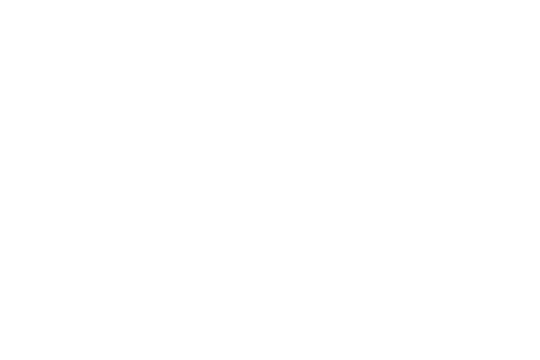

<IPython.core.display.Javascript object>


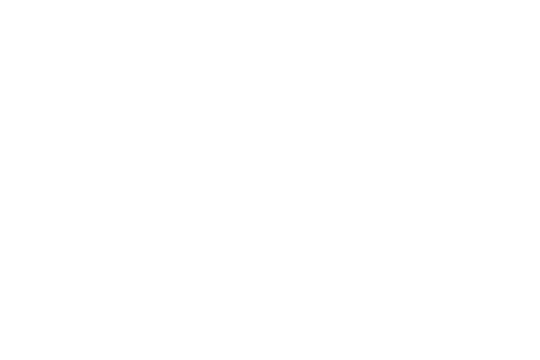

<IPython.core.display.Javascript object>


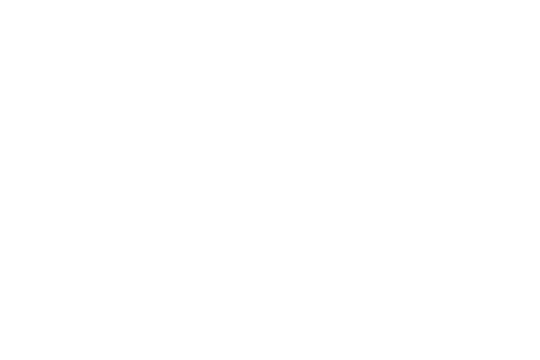

<IPython.core.display.Javascript object>


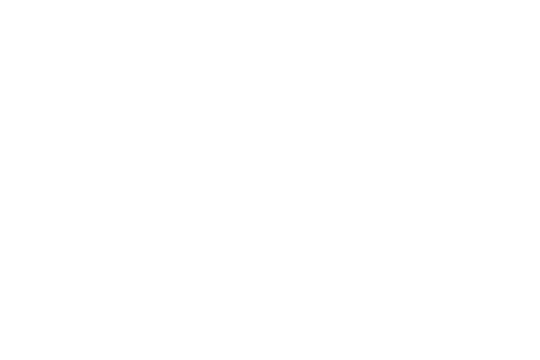




========================= Test Set ==============================



<IPython.core.display.Javascript object>


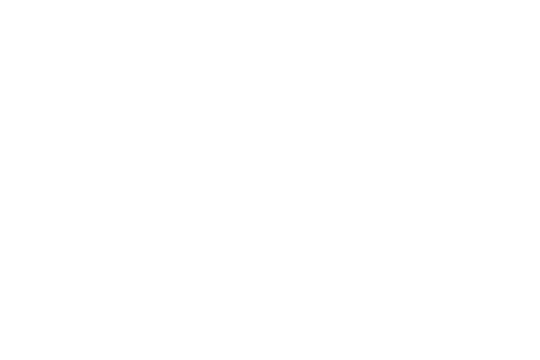

<IPython.core.display.Javascript object>


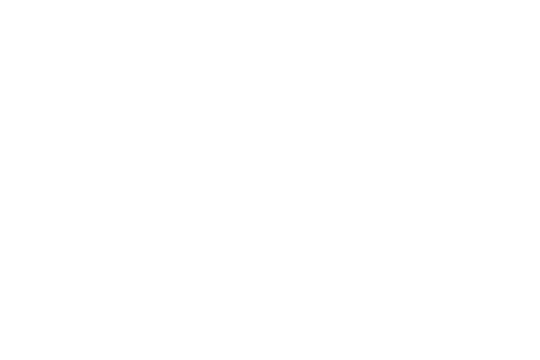

<IPython.core.display.Javascript object>


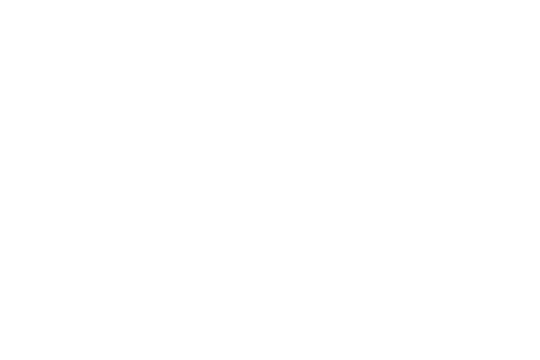

<IPython.core.display.Javascript object>


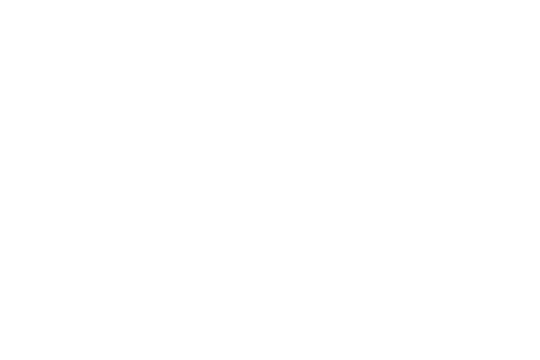

None


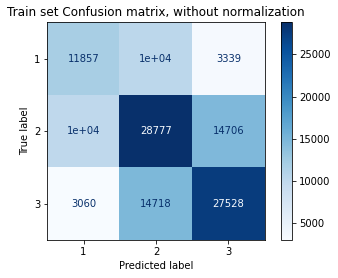

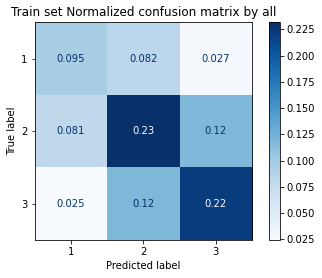

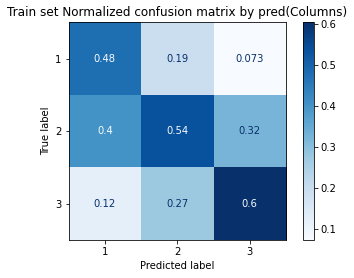

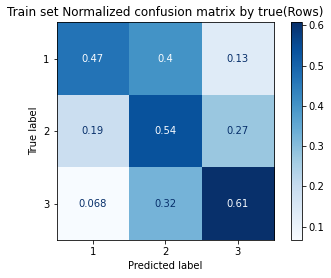

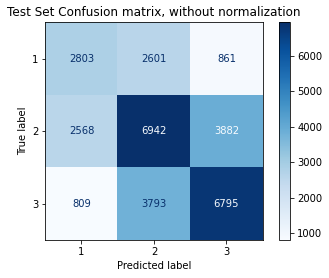

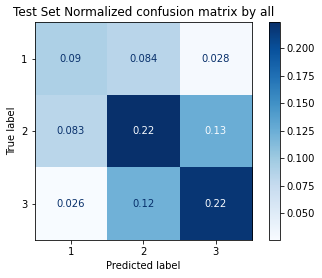

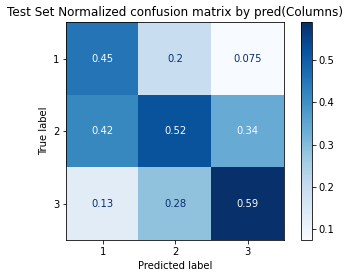

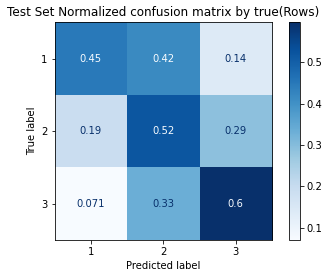

In [97]:
from catboost import CatBoostClassifier
catboost_model = CatBoostClassifier(iterations=6000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                    
                                    loss_function='MultiClass',
                                    learning_rate=0.01,
                                    depth=7,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "GPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


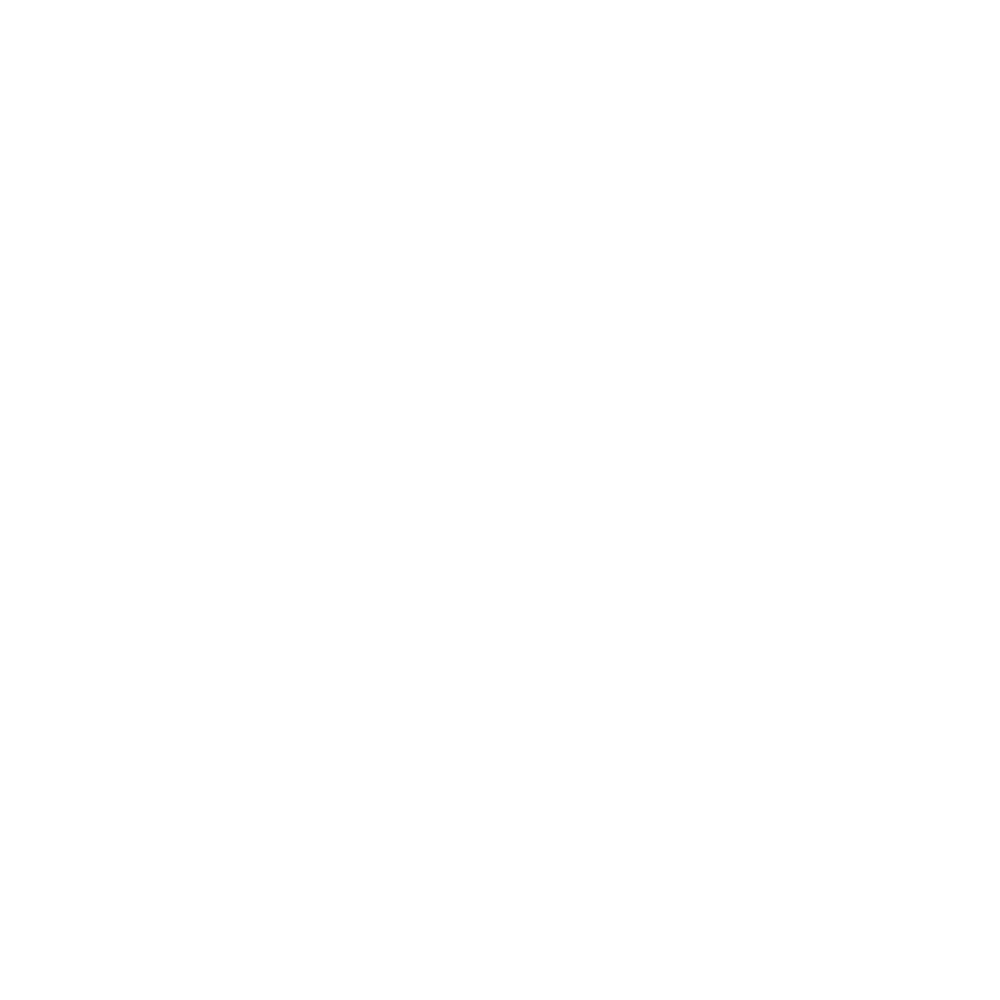

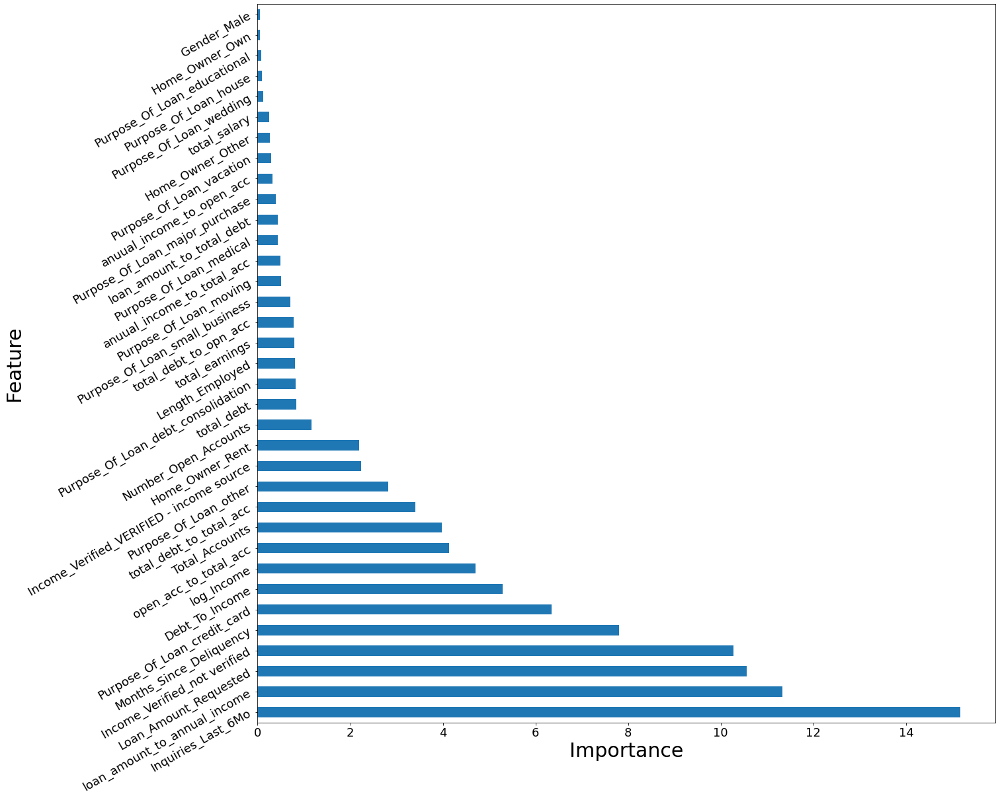

In [98]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5499130546789464 	 Test Accuracy: 0.5326205963804985
Train Log Loss: 0.9148548376938004 	 Test Log Loss: 0.933338158453206
Train AUC: 0.7372378320257976 		 Test AUC: 0.7182542209464331
Train F1: 0.5497407603542676 		 Test F1: 0.5323836725628047
Train recall: 0.5499130546789464 	 Test recall: 0.5326205963804985
Train precision: 0.5495821304747978 	 Test Precision: 0.5321684177643305

Train Classification report: 
              precision    recall  f1-score   support

           1       0.47      0.47      0.47     25413
           2       0.54      0.54      0.54     53497
           3       0.61      0.61      0.61     45306

    accuracy                           0.55    124216
   macro avg       0.54      0.54      0.54    124216
weighted avg       0.55      0.55      0.55    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45    

<IPython.core.display.Javascript object>


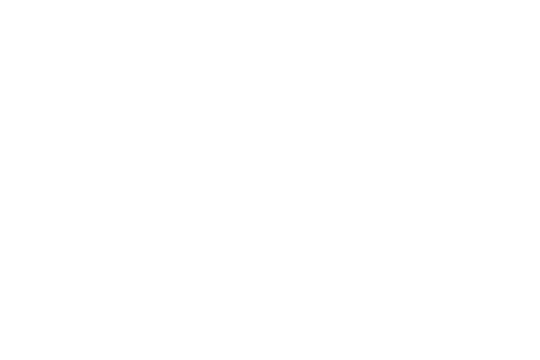

<IPython.core.display.Javascript object>


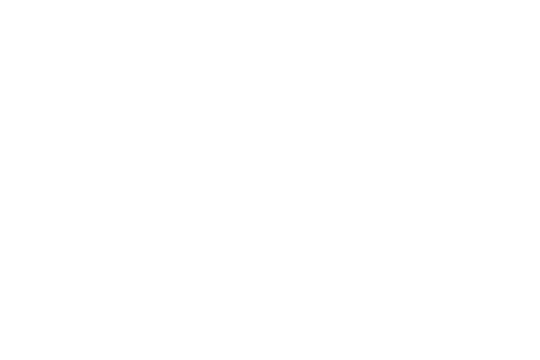

<IPython.core.display.Javascript object>


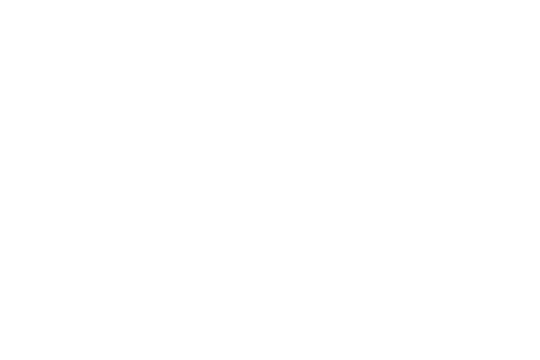

<IPython.core.display.Javascript object>


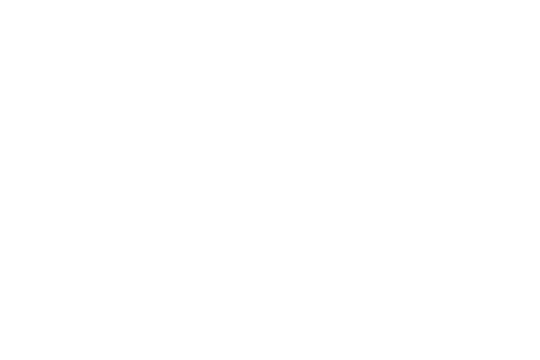




========================= Test Set ==============================



<IPython.core.display.Javascript object>


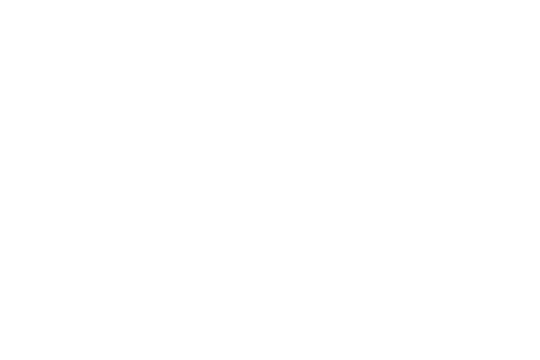

<IPython.core.display.Javascript object>


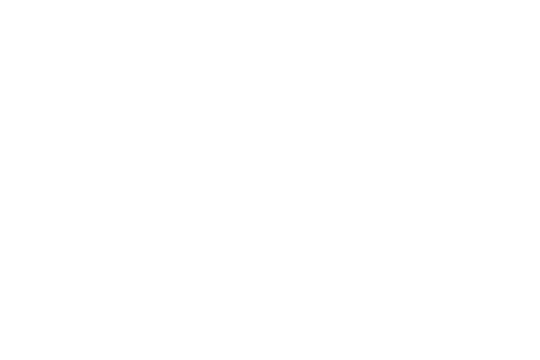

<IPython.core.display.Javascript object>


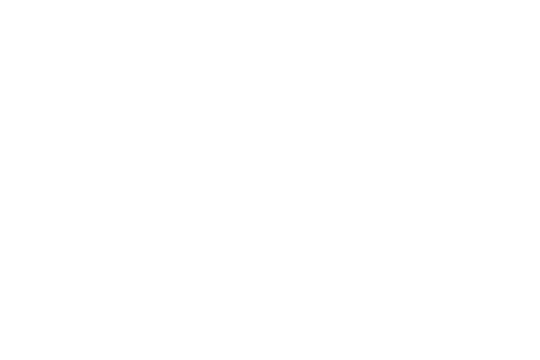

<IPython.core.display.Javascript object>


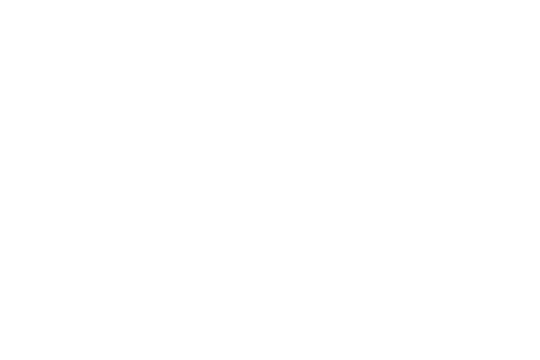

None


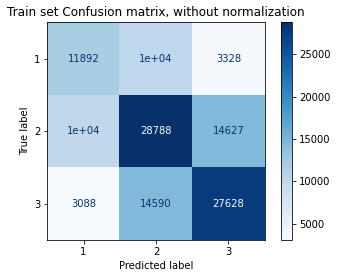

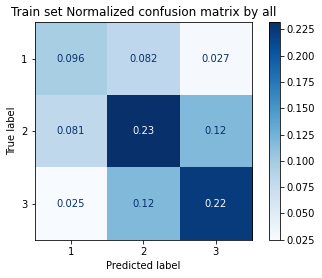

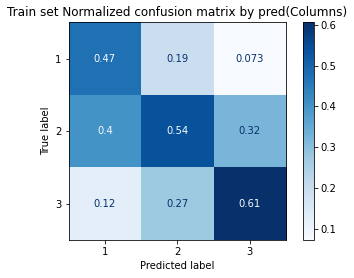

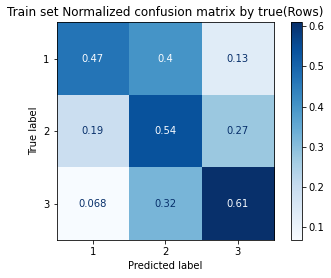

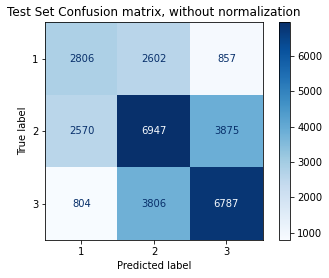

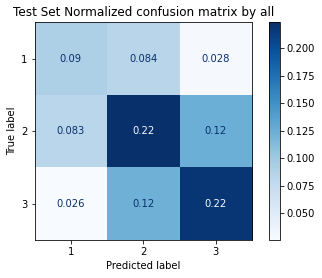

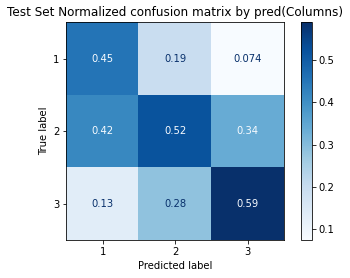

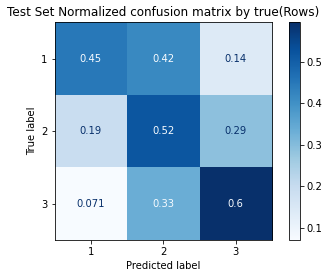

In [99]:
catboost_model = CatBoostClassifier(iterations=8000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                    
                                    loss_function='MultiClass',
                                    learning_rate=0.03,
                                    depth=7,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "GPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


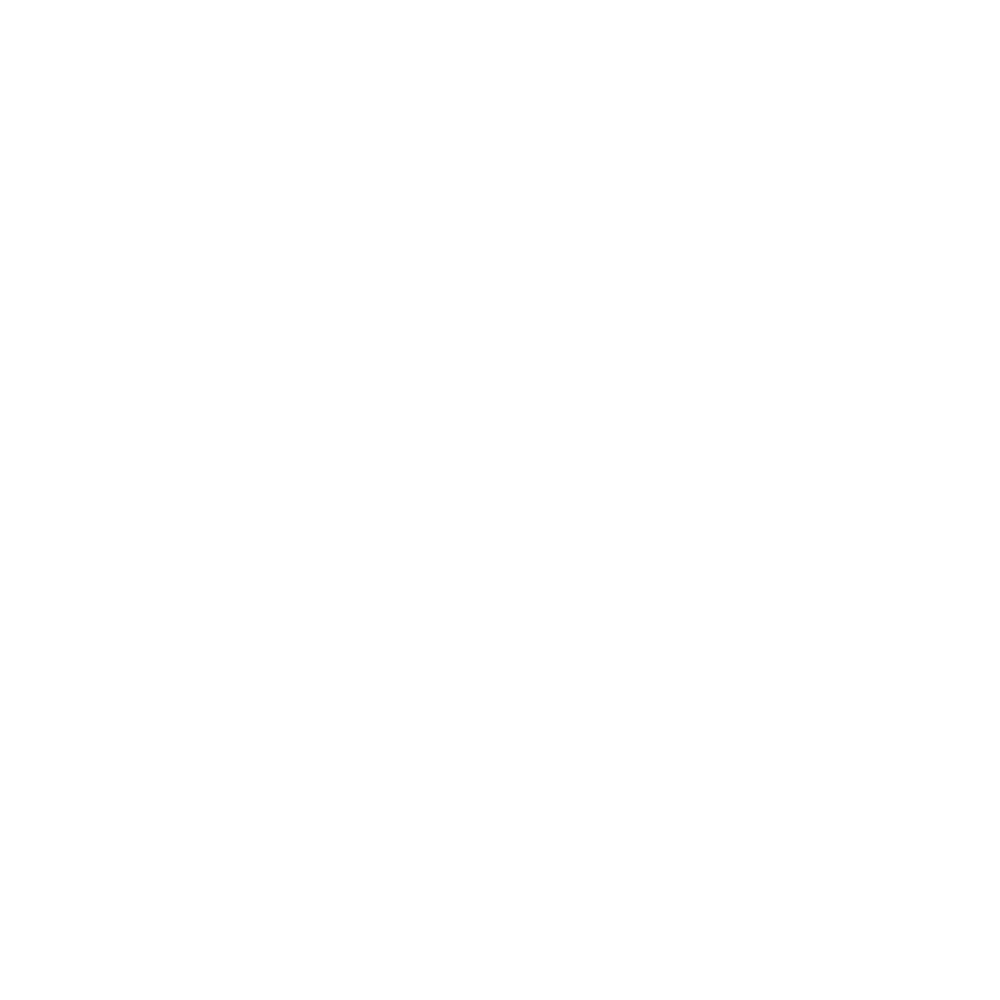

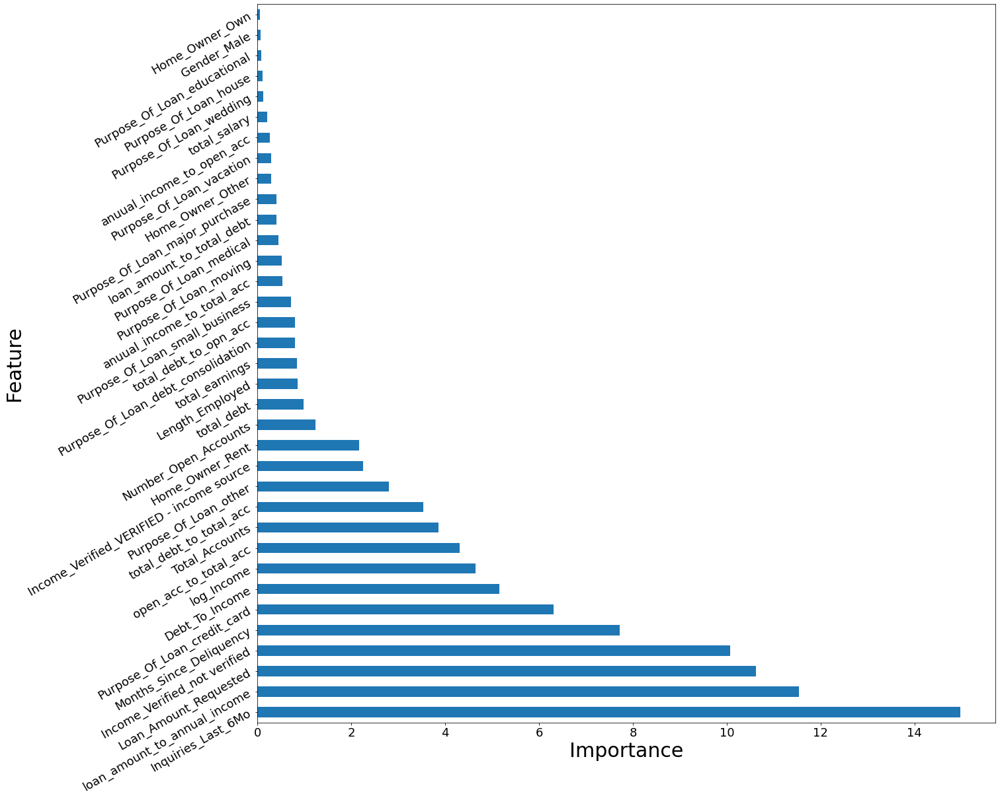

In [100]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5482224512140143 	 Test Accuracy: 0.5313003155793135
Train Log Loss: 0.9168470542856817 	 Test Log Loss: 0.934628532852353
Train AUC: 0.7354436629852952 		 Test AUC: 0.7170178029867141
Train F1: 0.5480501167838702 		 Test F1: 0.5310689657030359
Train recall: 0.5482224512140143 	 Test recall: 0.5313003155793135
Train precision: 0.547893749036918 	 Test Precision: 0.5308578358235752

Train Classification report: 
              precision    recall  f1-score   support

           1       0.47      0.47      0.47     25413
           2       0.54      0.54      0.54     53497
           3       0.60      0.61      0.61     45306

    accuracy                           0.55    124216
   macro avg       0.54      0.54      0.54    124216
weighted avg       0.55      0.55      0.55    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45     

<IPython.core.display.Javascript object>


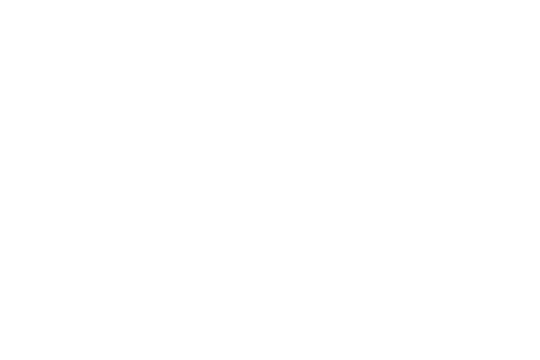

<IPython.core.display.Javascript object>


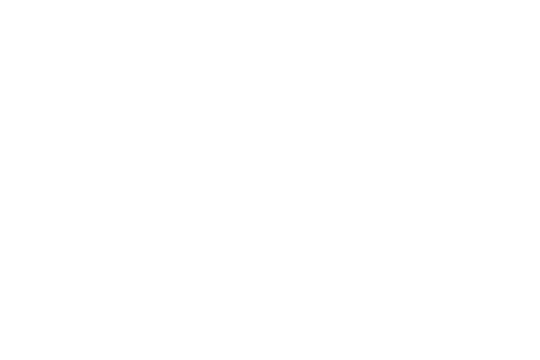

<IPython.core.display.Javascript object>


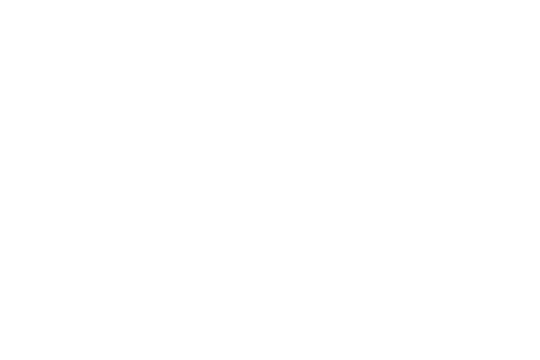

<IPython.core.display.Javascript object>


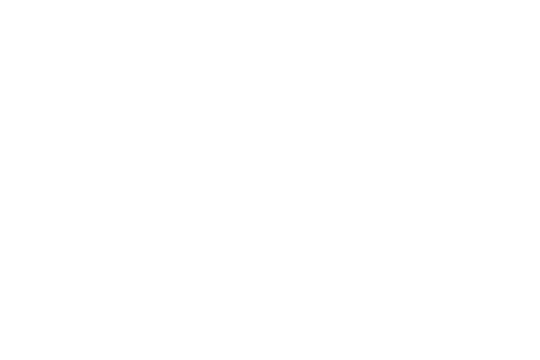




========================= Test Set ==============================



<IPython.core.display.Javascript object>


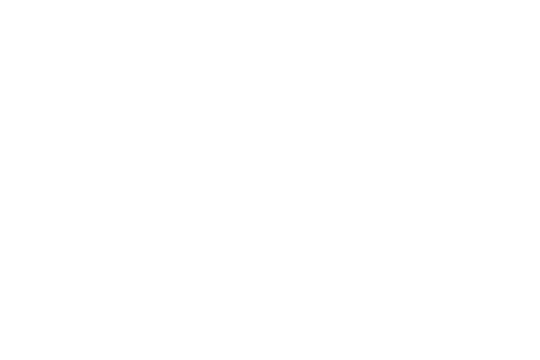

<IPython.core.display.Javascript object>


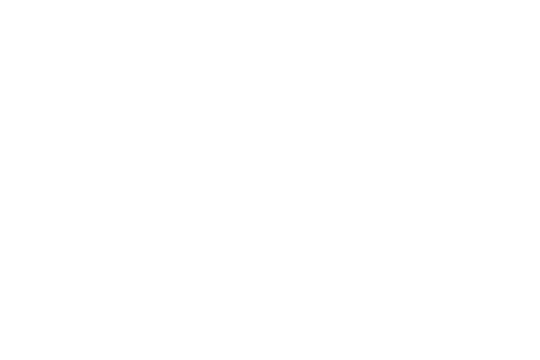

<IPython.core.display.Javascript object>


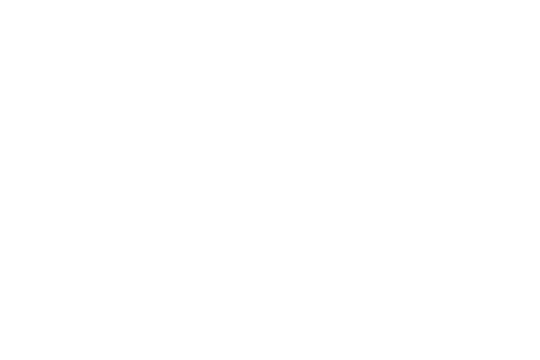

<IPython.core.display.Javascript object>


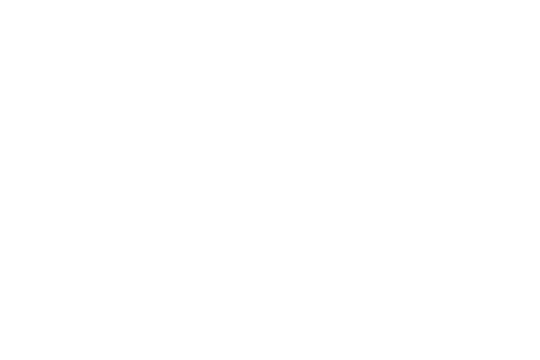

None


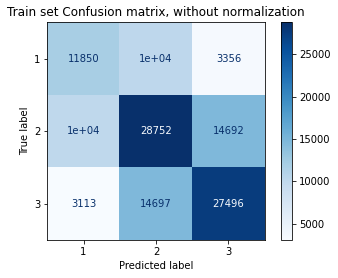

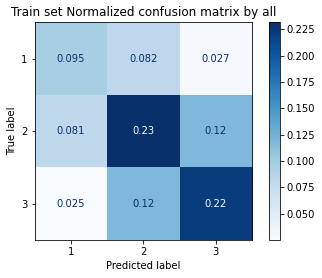

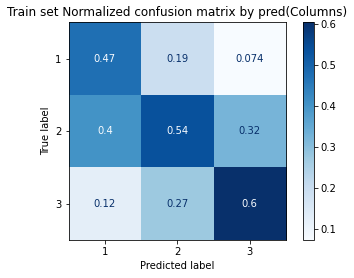

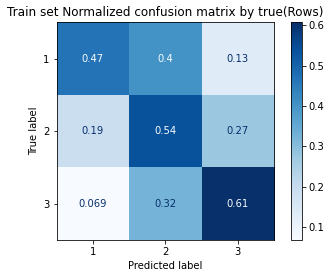

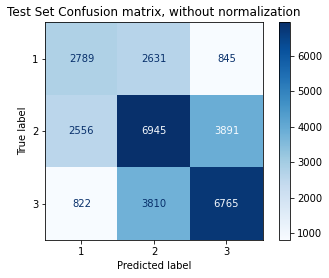

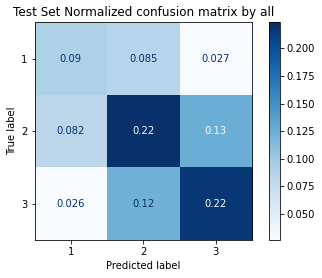

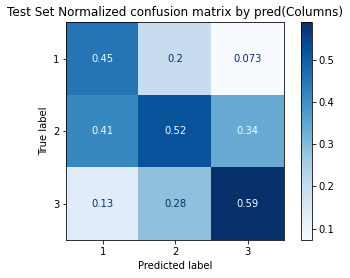

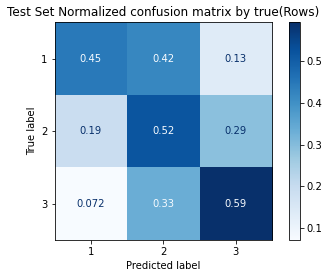

In [101]:
catboost_model = CatBoostClassifier(iterations=8000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                    
                                    loss_function='MultiClass',
                                    learning_rate=0.1,
                                    depth=7,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "GPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


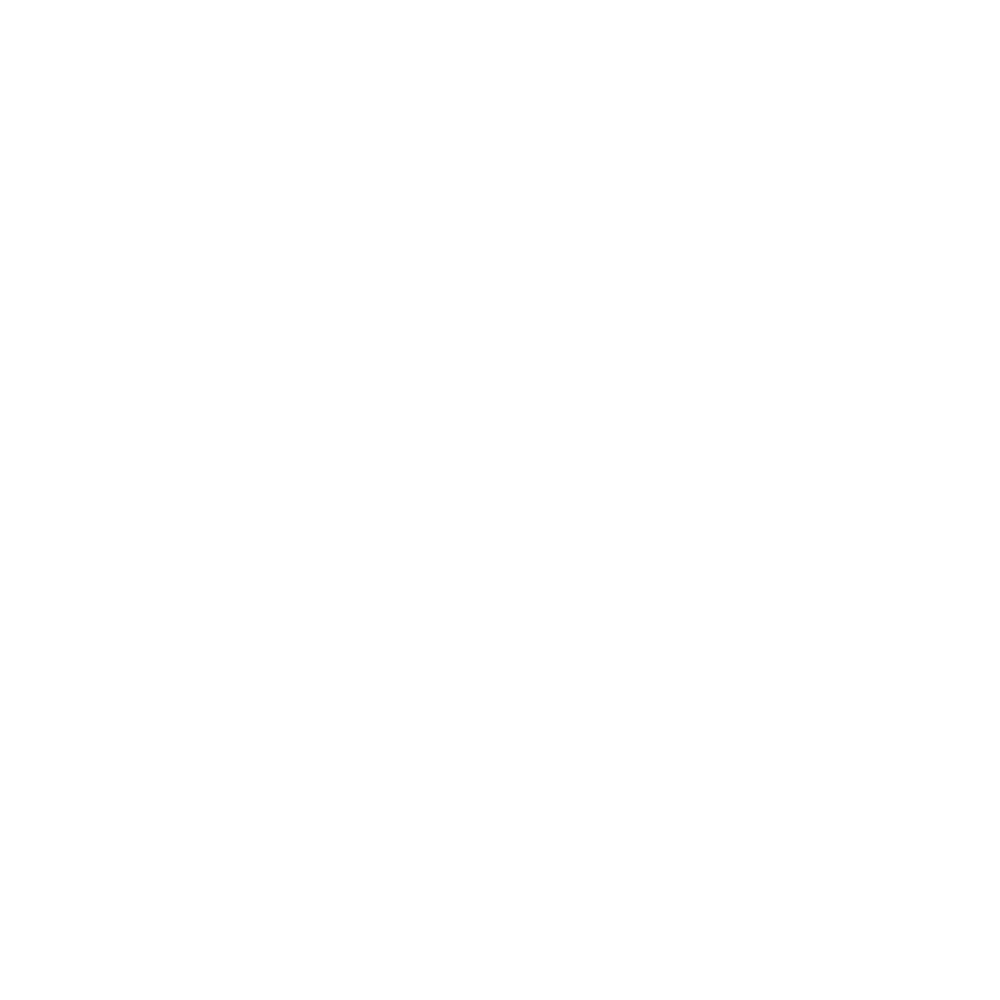

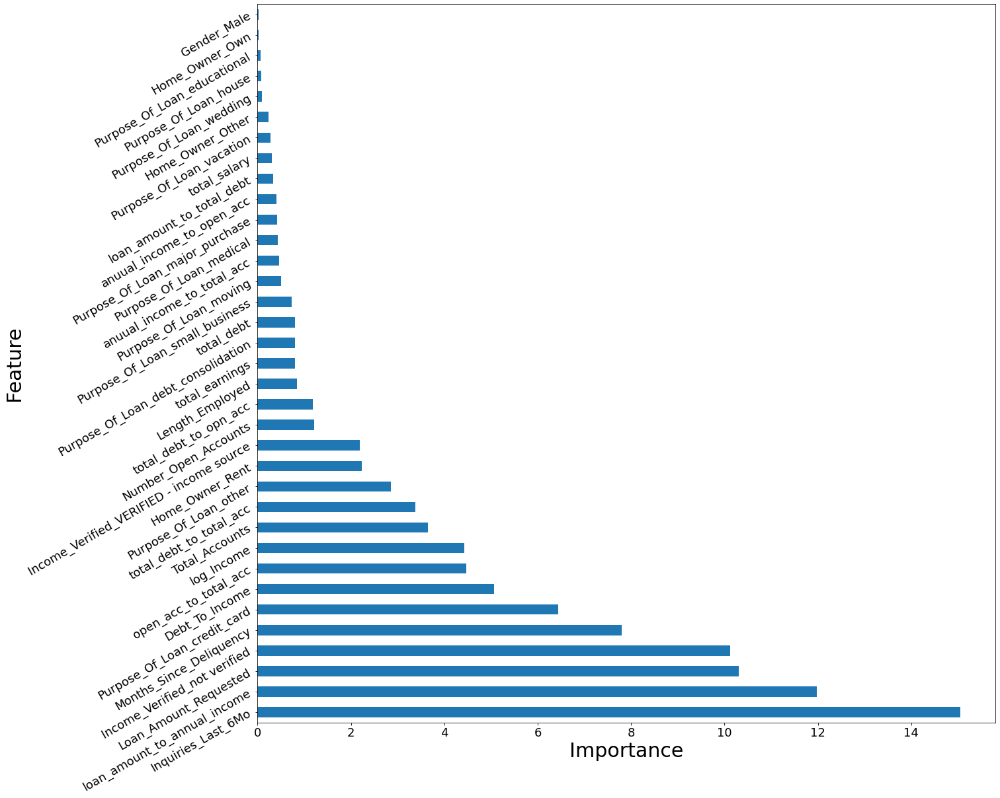

In [102]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5402685644361435 	 Test Accuracy: 0.5311071037547498
Train Log Loss: 0.9238740756610339 	 Test Log Loss: 0.9341774956445323
Train AUC: 0.7284210014728171 		 Test AUC: 0.7177326095131248
Train F1: 0.5402332615663025 		 Test F1: 0.531018048514957
Train recall: 0.5402685644361435 	 Test recall: 0.5311071037547498
Train precision: 0.5401985040013716 	 Test Precision: 0.5309385031255413

Train Classification report: 
              precision    recall  f1-score   support

           1       0.46      0.46      0.46     25413
           2       0.53      0.53      0.53     53497
           3       0.60      0.60      0.60     45306

    accuracy                           0.54    124216
   macro avg       0.53      0.53      0.53    124216
weighted avg       0.54      0.54      0.54    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45    

<IPython.core.display.Javascript object>


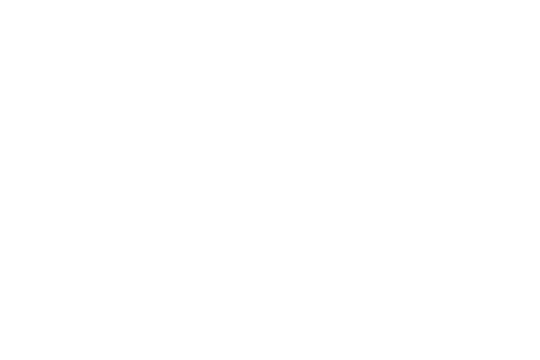

<IPython.core.display.Javascript object>


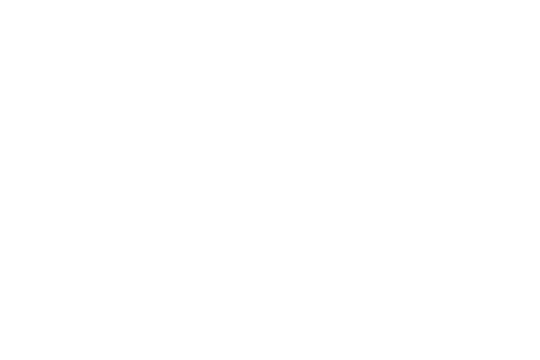

<IPython.core.display.Javascript object>


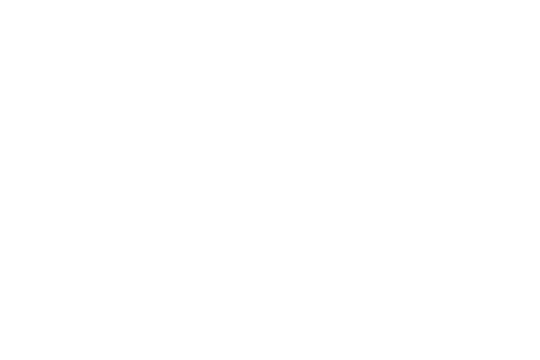

<IPython.core.display.Javascript object>


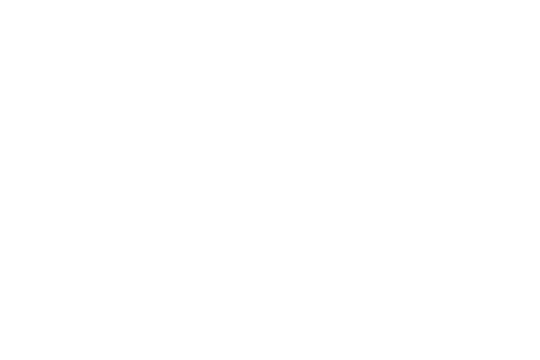




========================= Test Set ==============================



<IPython.core.display.Javascript object>


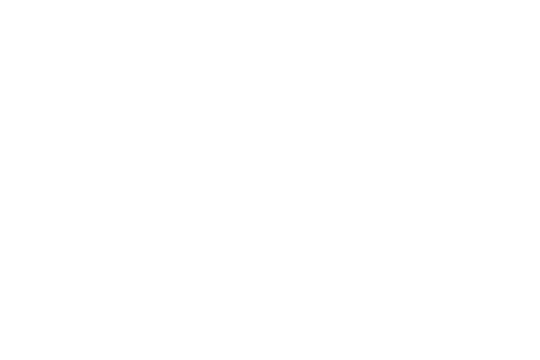

<IPython.core.display.Javascript object>


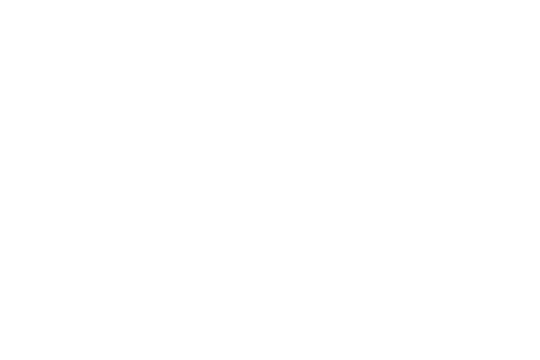

<IPython.core.display.Javascript object>


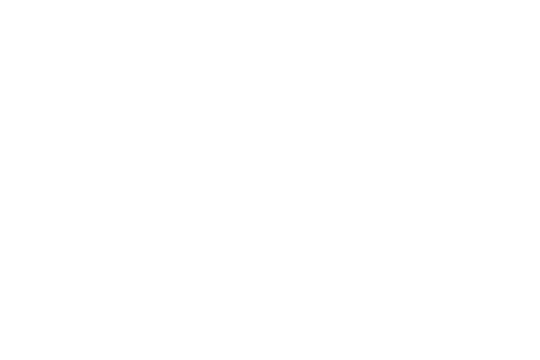

<IPython.core.display.Javascript object>


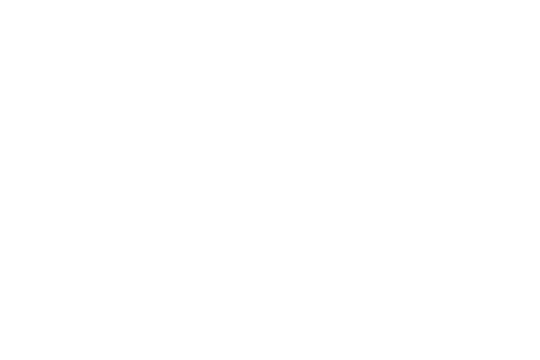

None


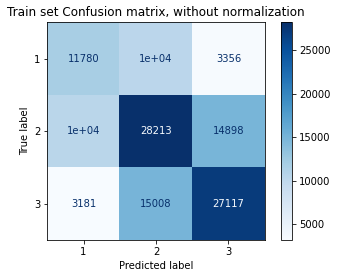

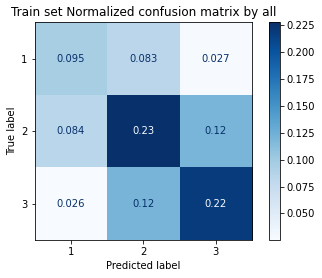

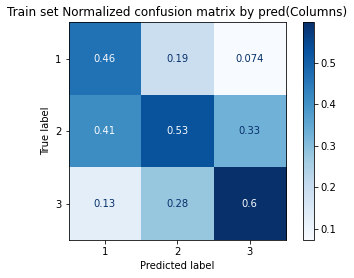

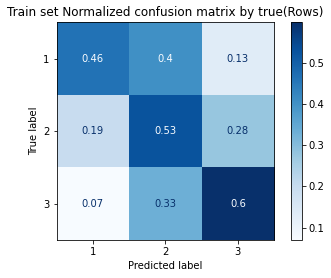

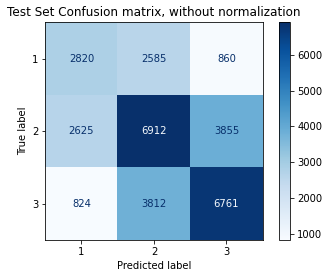

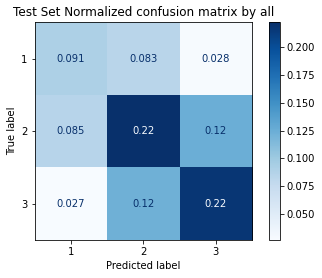

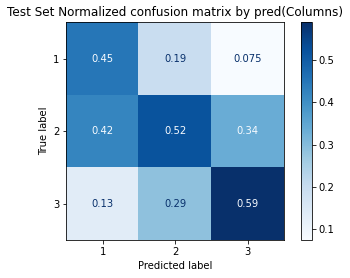

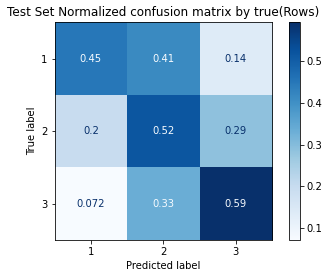

In [106]:
catboost_model = CatBoostClassifier(iterations=6000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                    colsample_bylevel = 0.8,
                                    loss_function='MultiClass',
                                    learning_rate=0.01,
                                    depth=5,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "CPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))


<IPython.core.display.Javascript object>


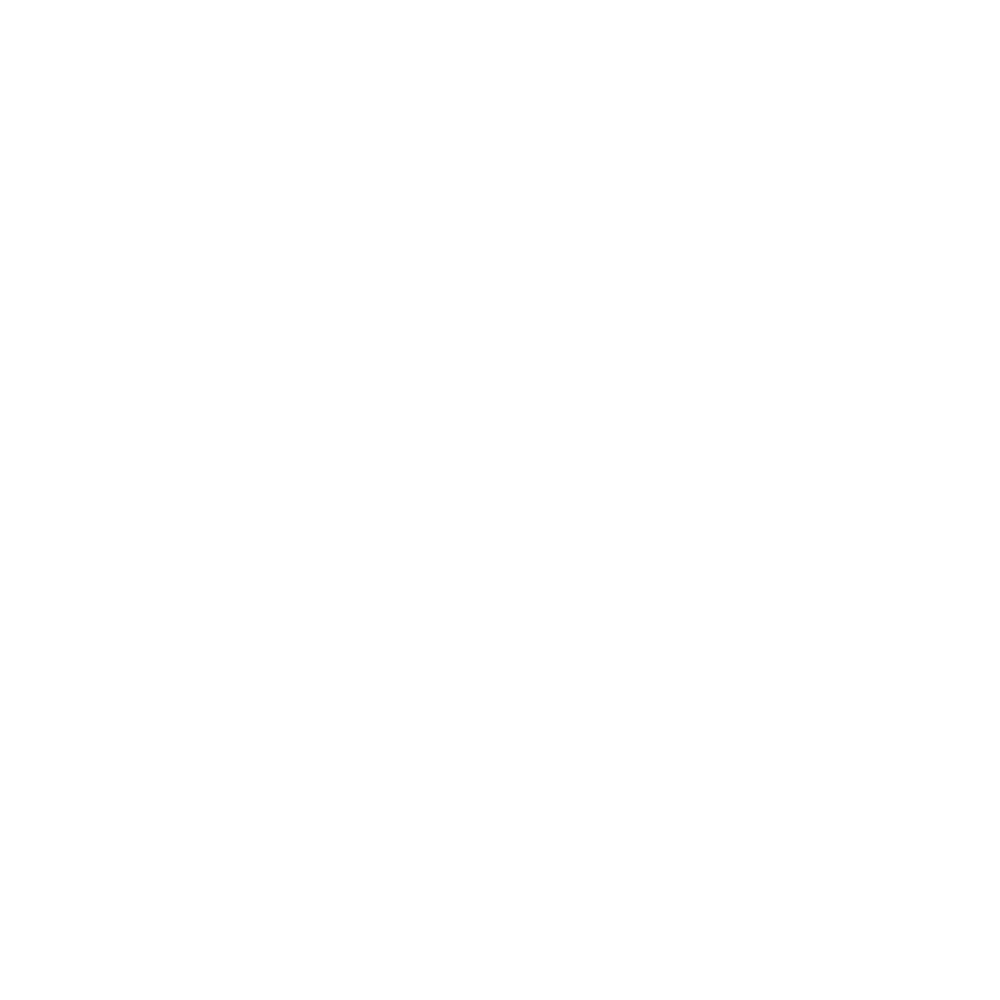

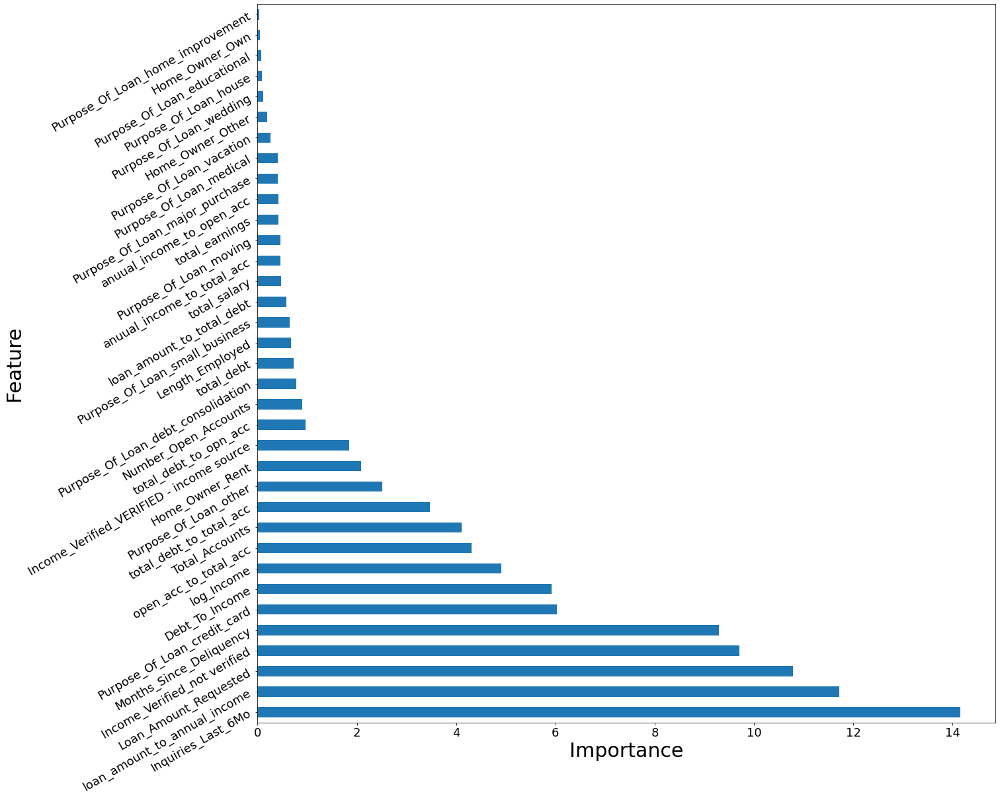

In [107]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5451874154698267 	 Test Accuracy: 0.5326850003220197
Train Log Loss: 0.9178446069407605 	 Test Log Loss: 0.931986926925499
Train AUC: 0.7334853207613881 		 Test AUC: 0.7193235833023968
Train F1: 0.5451743545850163 		 Test F1: 0.5326657722140713
Train recall: 0.5451874154698267 	 Test recall: 0.5326850003220197
Train precision: 0.545163306107552 	 Test Precision: 0.5326574632099582

Train Classification report: 
              precision    recall  f1-score   support

           1       0.47      0.47      0.47     25413
           2       0.53      0.53      0.53     53497
           3       0.60      0.60      0.60     45306

    accuracy                           0.55    124216
   macro avg       0.53      0.54      0.53    124216
weighted avg       0.55      0.55      0.55    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45     

<IPython.core.display.Javascript object>


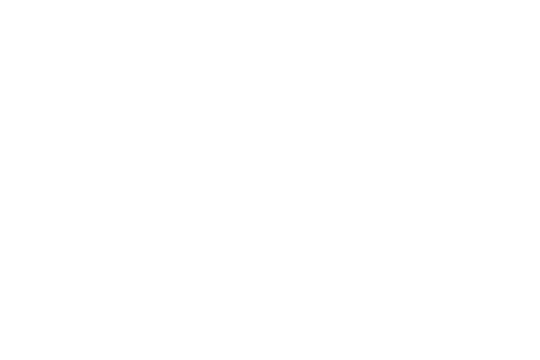

<IPython.core.display.Javascript object>


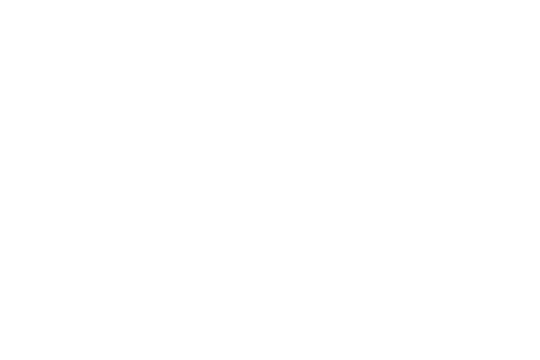

<IPython.core.display.Javascript object>


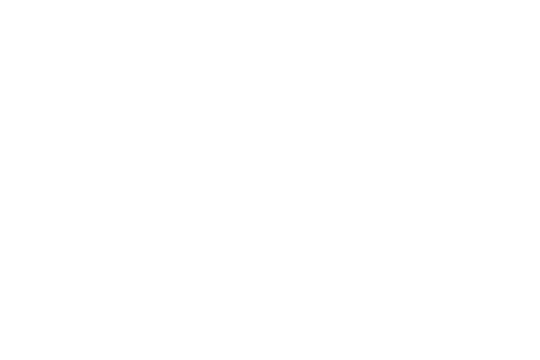

<IPython.core.display.Javascript object>


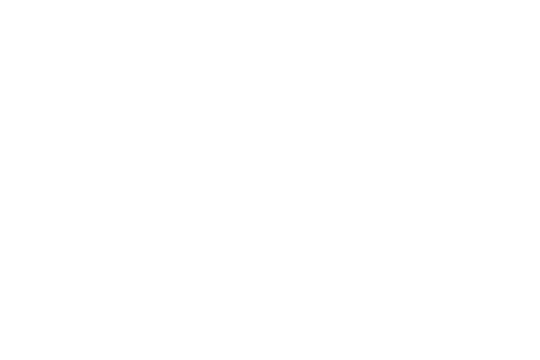




========================= Test Set ==============================



<IPython.core.display.Javascript object>


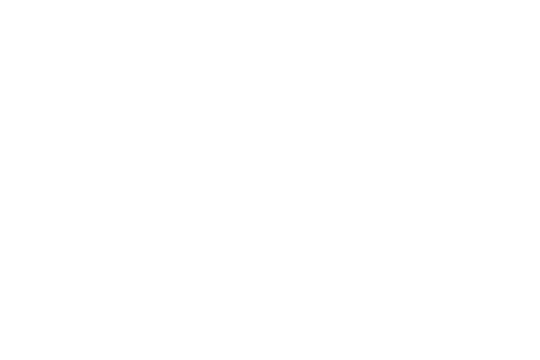

<IPython.core.display.Javascript object>


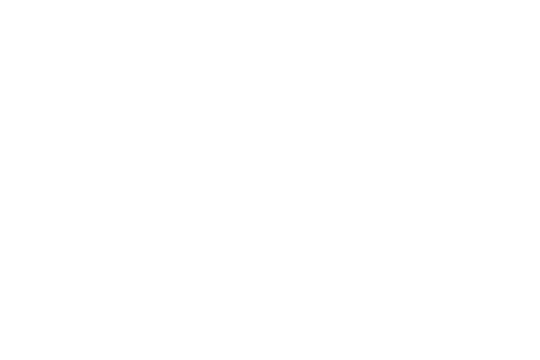

<IPython.core.display.Javascript object>


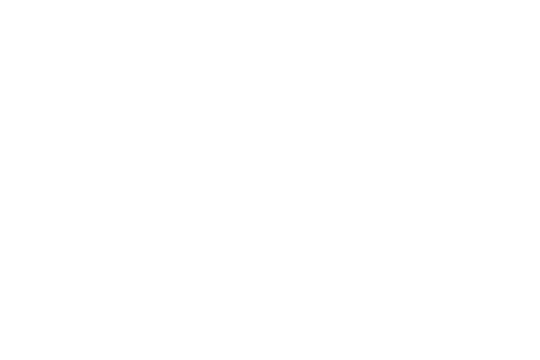

<IPython.core.display.Javascript object>


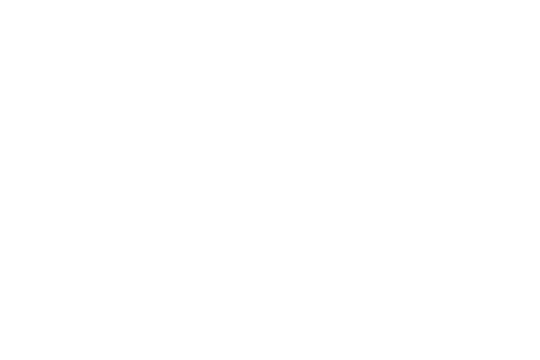

None


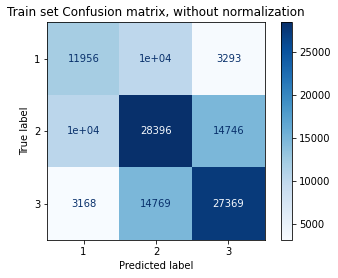

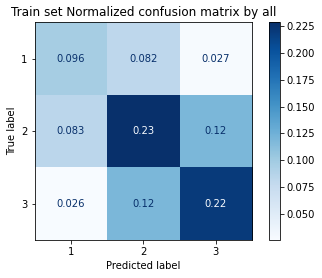

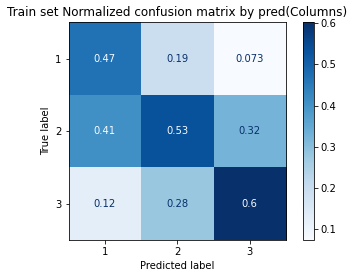

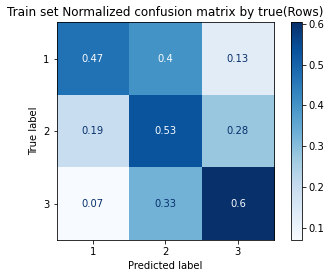

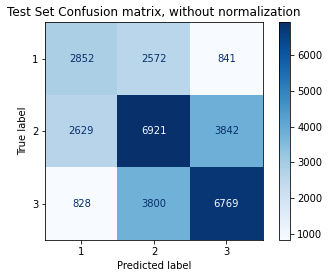

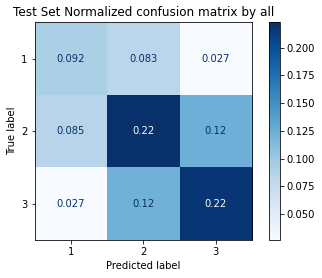

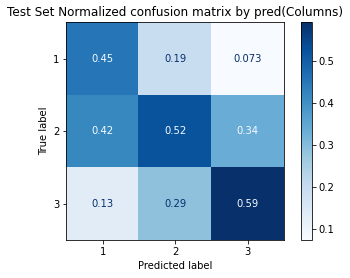

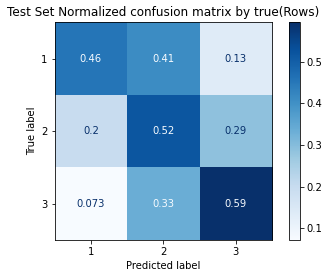

In [109]:
catboost_model = CatBoostClassifier(iterations=8000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                 
                                    loss_function='MultiClass',
                                    learning_rate=0.03,
                                    depth=5,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "GPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


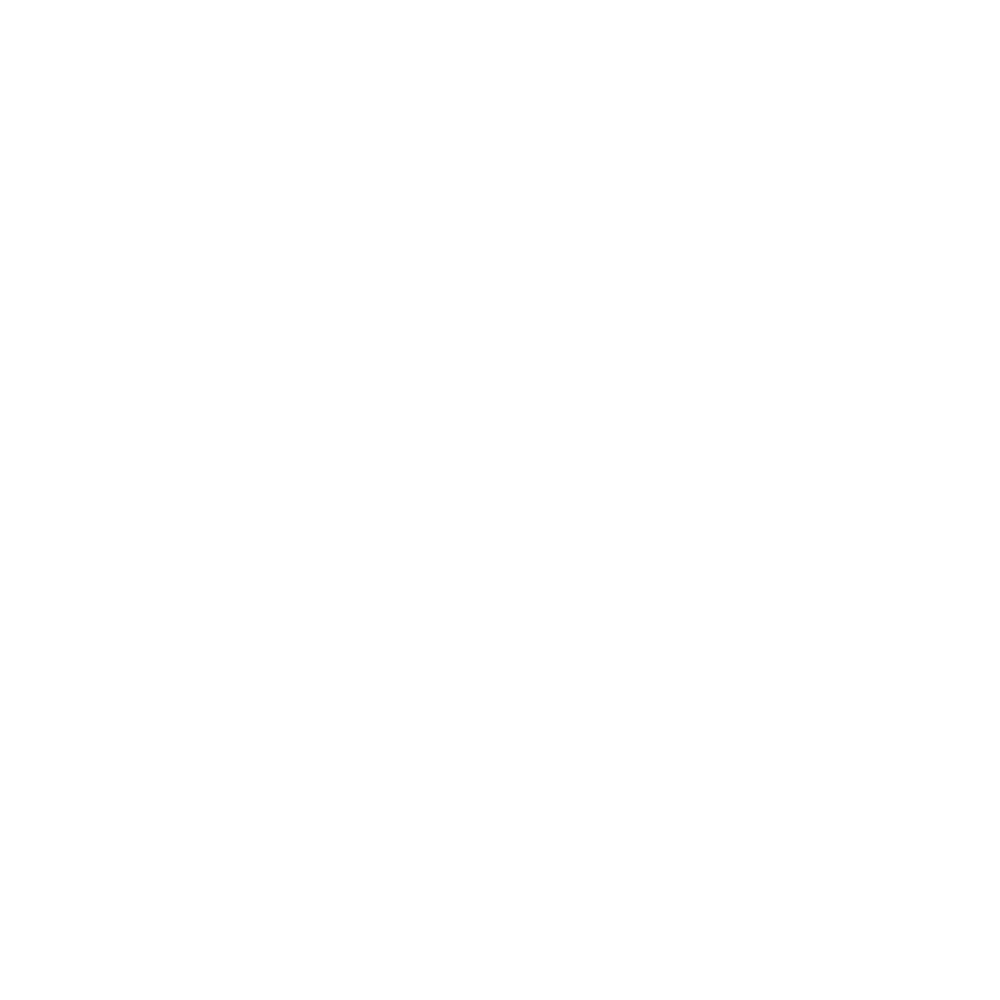

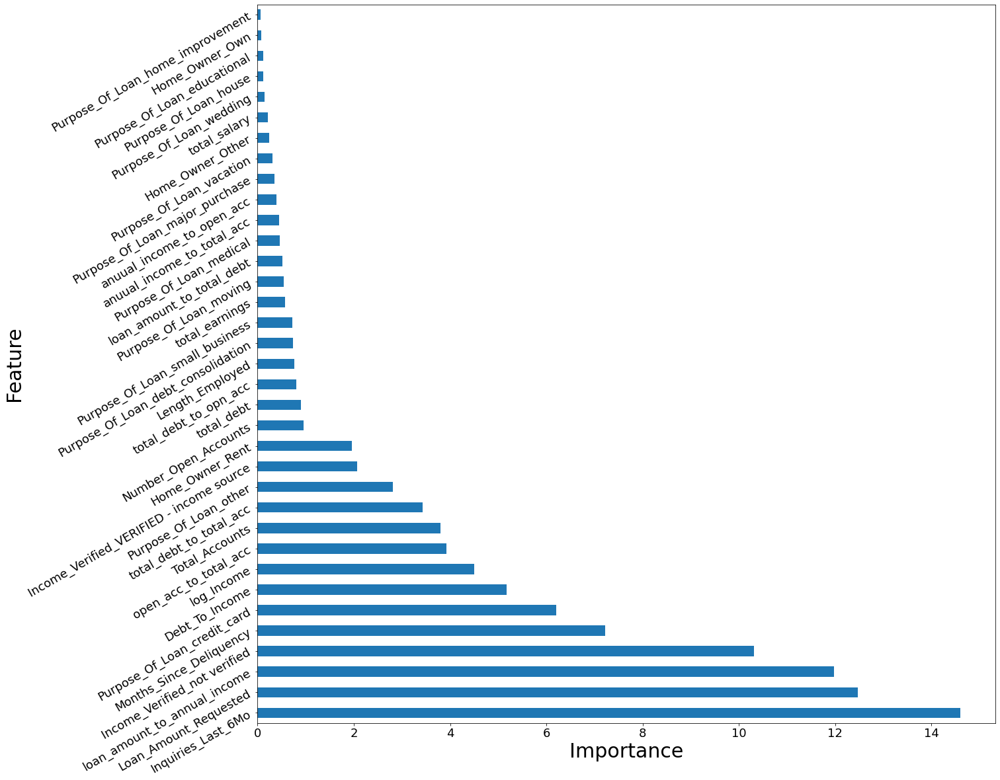

In [110]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

####################### model Evalution started #######################
Train Accuracy: 0.5465962516906034 	 Test Accuracy: 0.5320731628775681
Train Log Loss: 0.9161468702082951 	 Test Log Loss: 0.9325037069086338
Train AUC: 0.7343944735915567 		 Test AUC: 0.7183907408521476
Train F1: 0.546712406174586 		 Test F1: 0.5320777479467148
Train recall: 0.5465962516906034 	 Test recall: 0.5320731628775681
Train precision: 0.5468350076055497 	 Test Precision: 0.5320876503704508

Train Classification report: 
              precision    recall  f1-score   support

           1       0.47      0.47      0.47     25413
           2       0.53      0.53      0.53     53497
           3       0.61      0.60      0.60     45306

    accuracy                           0.55    124216
   macro avg       0.54      0.54      0.54    124216
weighted avg       0.55      0.55      0.55    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45    

<IPython.core.display.Javascript object>


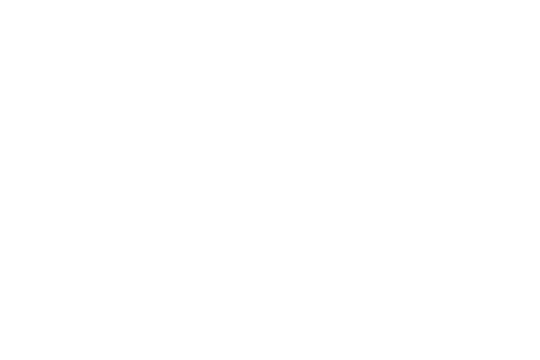

<IPython.core.display.Javascript object>


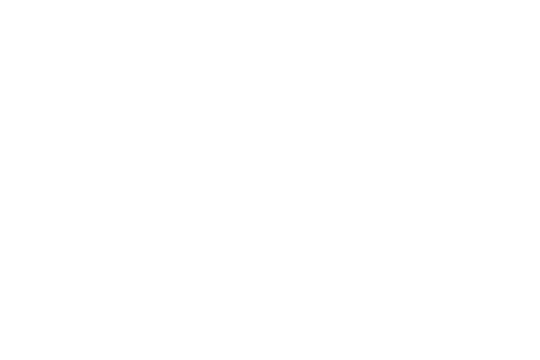

<IPython.core.display.Javascript object>


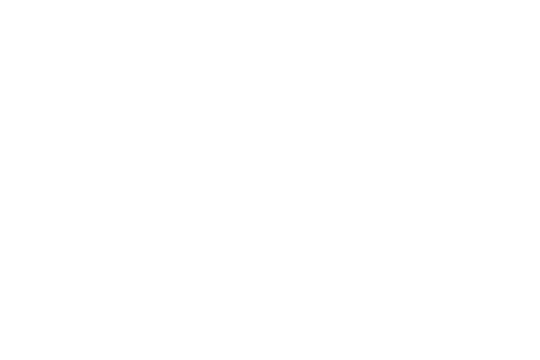

<IPython.core.display.Javascript object>


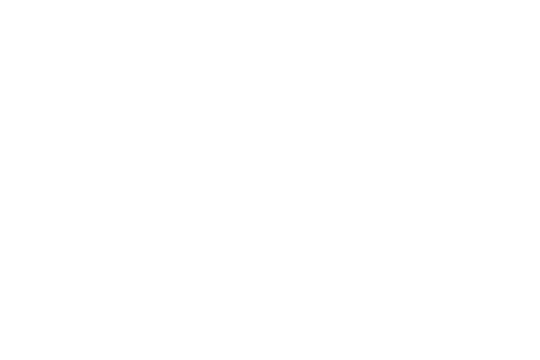




========================= Test Set ==============================



<IPython.core.display.Javascript object>


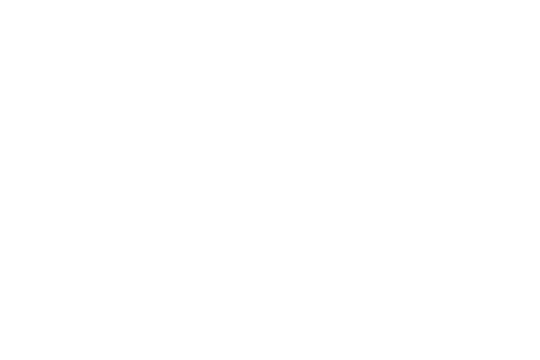

<IPython.core.display.Javascript object>


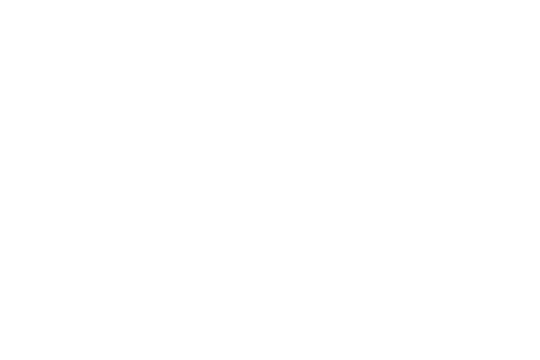

<IPython.core.display.Javascript object>


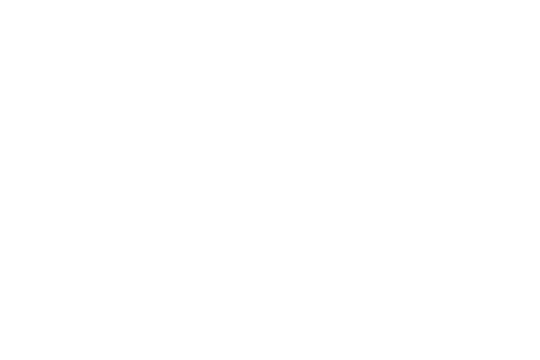

<IPython.core.display.Javascript object>


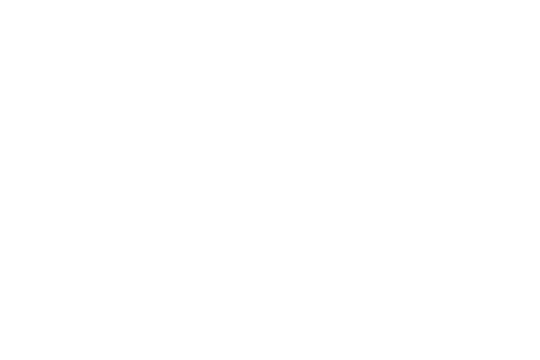

None


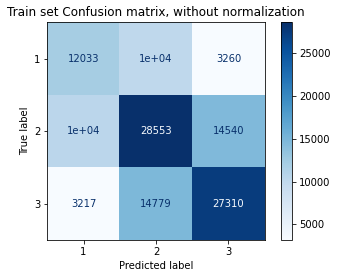

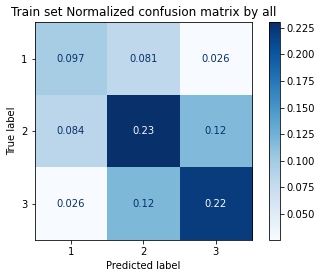

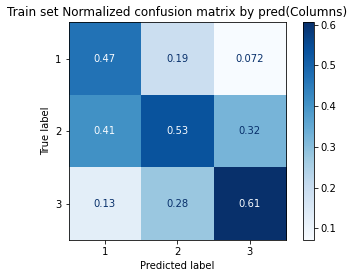

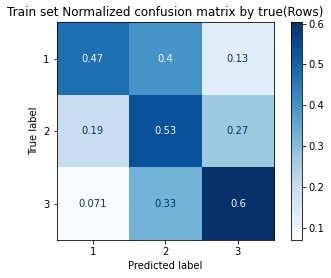

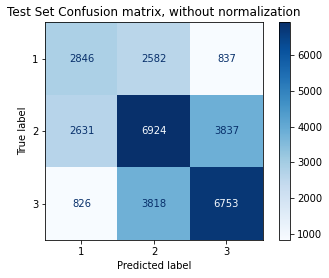

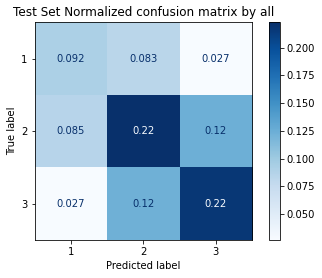

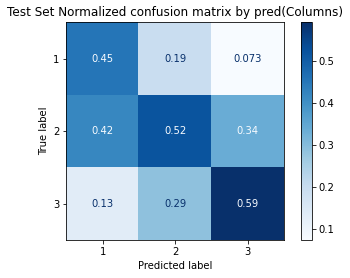

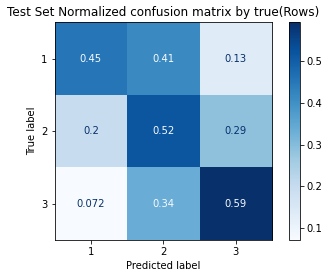

In [111]:
catboost_model = CatBoostClassifier(iterations=8000,
                                    early_stopping_rounds=5,
                                    verbose=False,
                                    
                                    loss_function='MultiClass',
                                    learning_rate=0.3,
                                    depth=5,
                                    class_weights={1:1.5,2:1,3:1.05},
                                    task_type = "GPU",devices='0:1')
catboost_model.fit(x_train, 
                   y_train,

                   eval_set=(x_test, y_test),
                   use_best_model=True,
                   verbose=False,plot=True)

print(classification_model_evaluation(catboost_model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


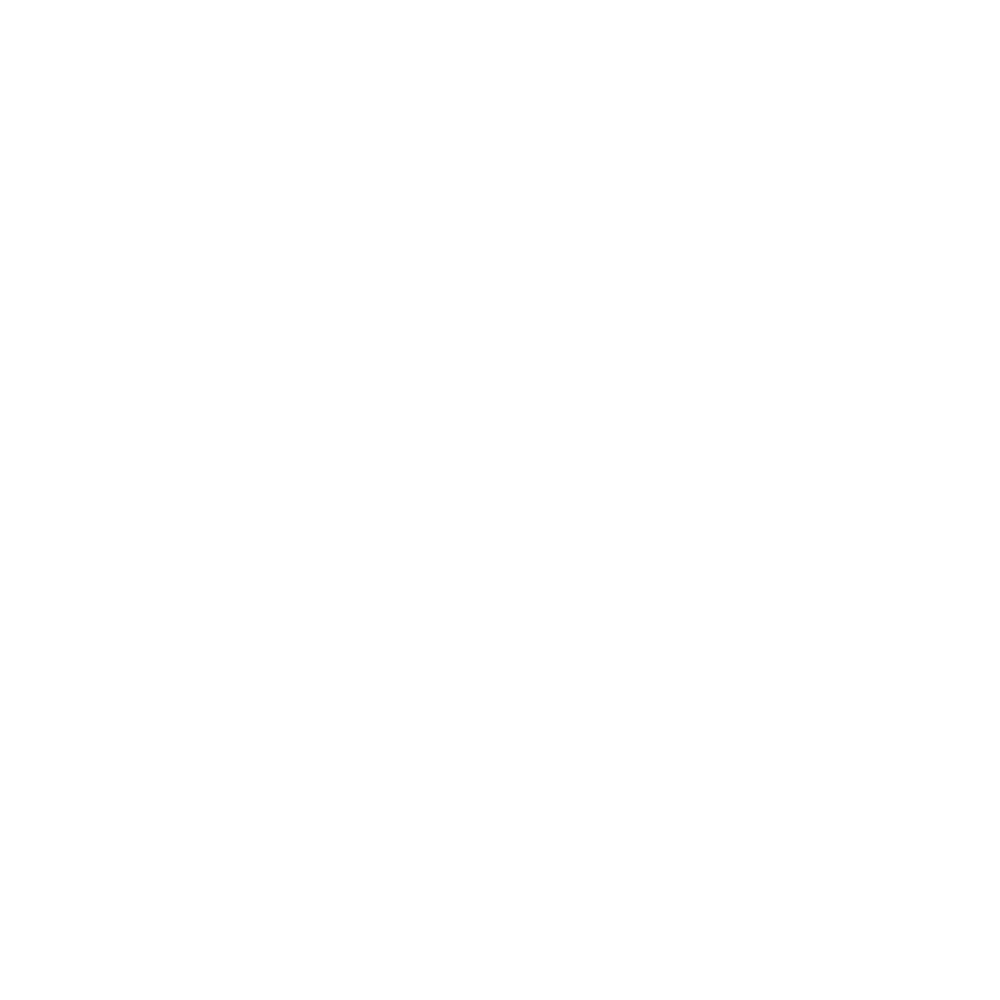

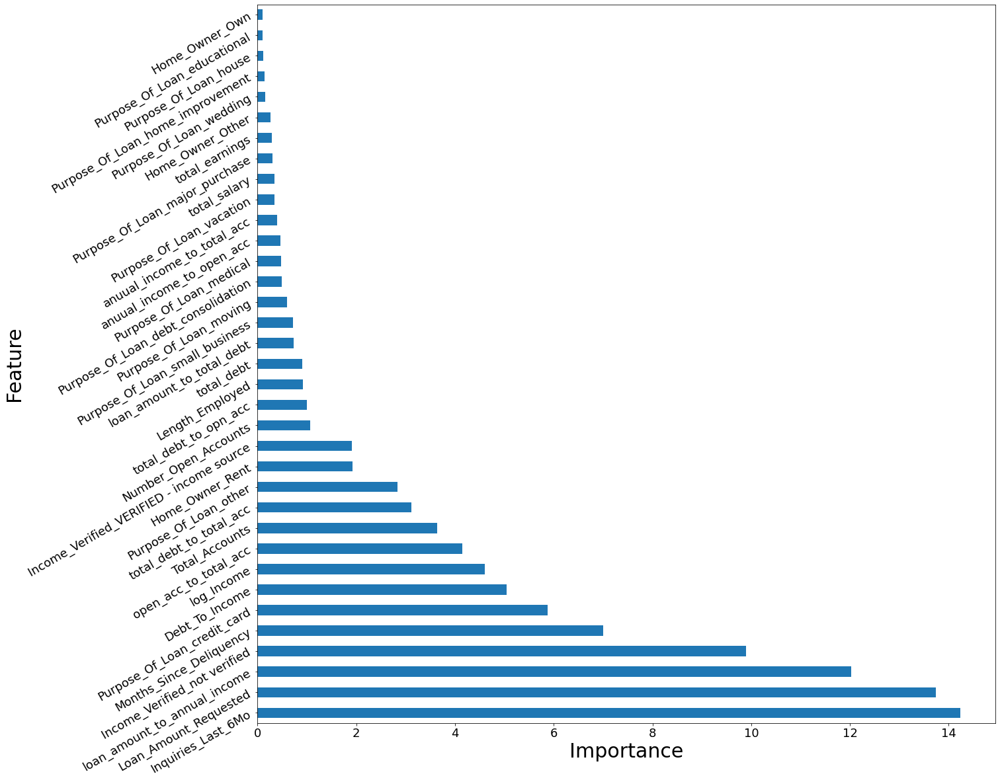

In [112]:
plt.figure(figsize=(20,20))
(pd.Series(catboost_model.get_feature_importance(), index=x_test.columns)
   .nlargest(35)
   .plot(kind='barh')) 


plt.xticks(size=18,rotation=0)
plt.yticks(size=18,rotation=30)
plt.xlabel('Importance',fontsize=30)
plt.ylabel('Feature',fontsize=30)
plt.show()

In [117]:
from lightgbm import LGBMClassifier
%%time
model = LGBMClassifier(learning_rate=0.1,n_estimators=3000,colsample_bytree=0.9,max_depth=5,num_leaves=37,random_state=8,class_weight={1:1.3,2:0.85,3:0.9})

model.fit(x_train, y_train, eval_set=(x_test, y_test),early_stopping_rounds=4,callbacks=None,verbose=False)

model_evalution(model)

UsageError: Line magic function `%%time` not found.


####################### model Evalution started #######################
Train Accuracy: 0.5640738713209248 	 Test Accuracy: 0.5335866555033169
Train Log Loss: 0.8978388683864263 	 Test Log Loss: 0.9335124727283562
Train AUC: 0.7541249200711354 		 Test AUC: 0.718720417764474
Train F1: 0.5639171881914784 		 Test F1: 0.5333521891074097
Train recall: 0.5640738713209248 	 Test recall: 0.5335866555033169
Train precision: 0.5640460103333664 	 Test Precision: 0.5333320618236432

Train Classification report: 
              precision    recall  f1-score   support

           1       0.48      0.50      0.49     25413
           2       0.56      0.54      0.55     53497
           3       0.61      0.63      0.62     45306

    accuracy                           0.56    124216
   macro avg       0.55      0.56      0.55    124216
weighted avg       0.56      0.56      0.56    124216
 
 Test classification report: 
              precision    recall  f1-score   support

           1       0.45    

<IPython.core.display.Javascript object>


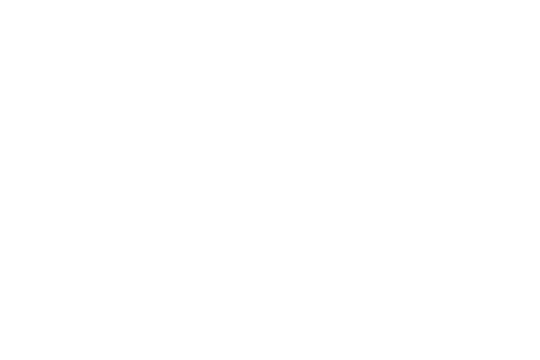

<IPython.core.display.Javascript object>


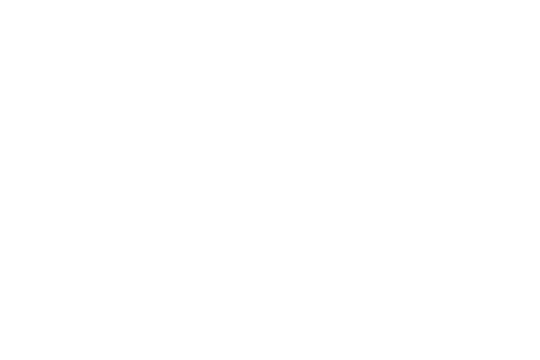

<IPython.core.display.Javascript object>


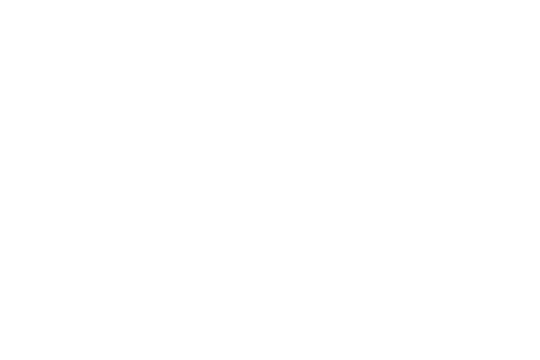

<IPython.core.display.Javascript object>


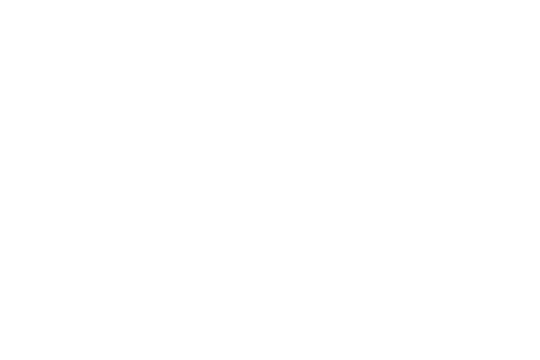




========================= Test Set ==============================



<IPython.core.display.Javascript object>


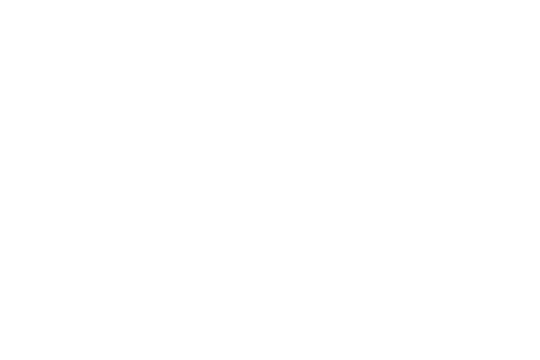

<IPython.core.display.Javascript object>


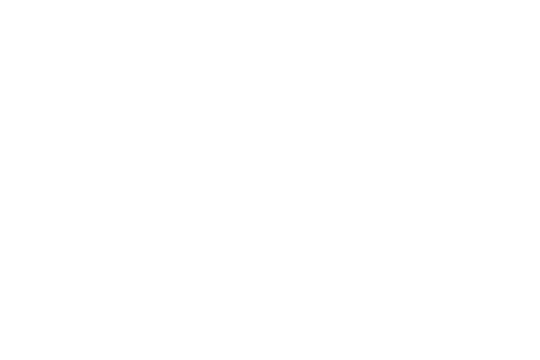

<IPython.core.display.Javascript object>


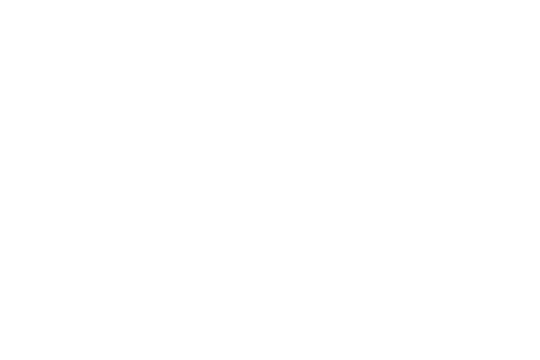

<IPython.core.display.Javascript object>


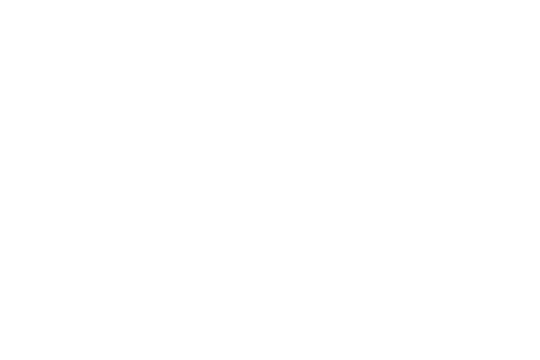

None
Wall time: 8.71 s


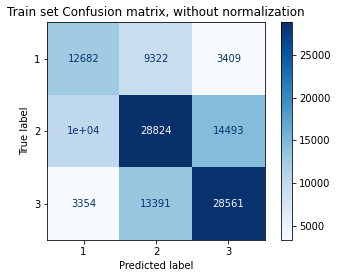

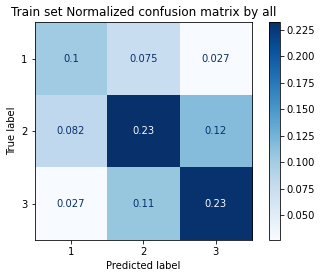

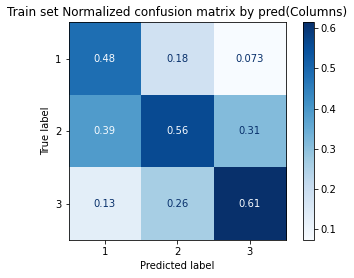

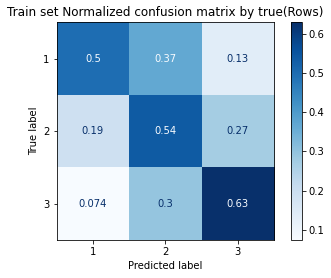

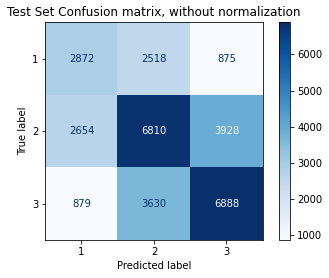

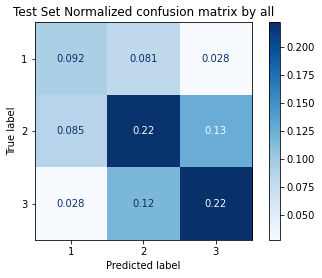

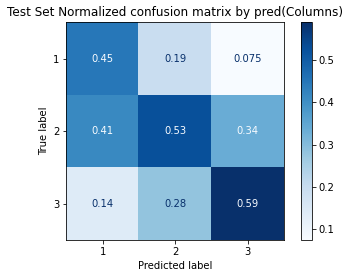

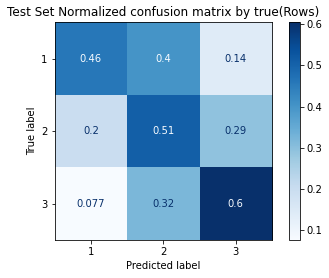

In [120]:
%%time
model = LGBMClassifier(learning_rate=0.1,n_estimators=3000,colsample_bytree=.8,max_depth=11,num_leaves=37,random_state=1,class_weight={1:1.3,2:0.85,3:0.9})

model.fit(x_train, y_train, eval_set=(x_test, y_test),early_stopping_rounds=4,callbacks=None,verbose=False)

print(classification_model_evaluation(model,x_train,y_train,x_test,y_test))

<IPython.core.display.Javascript object>


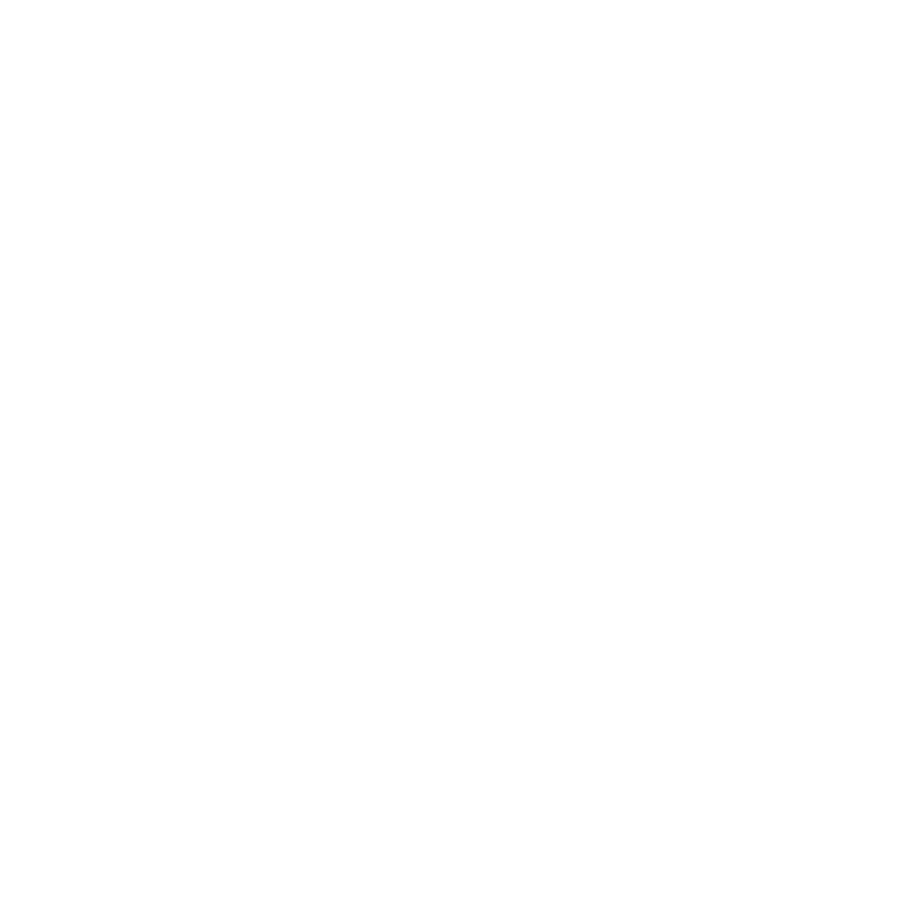

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

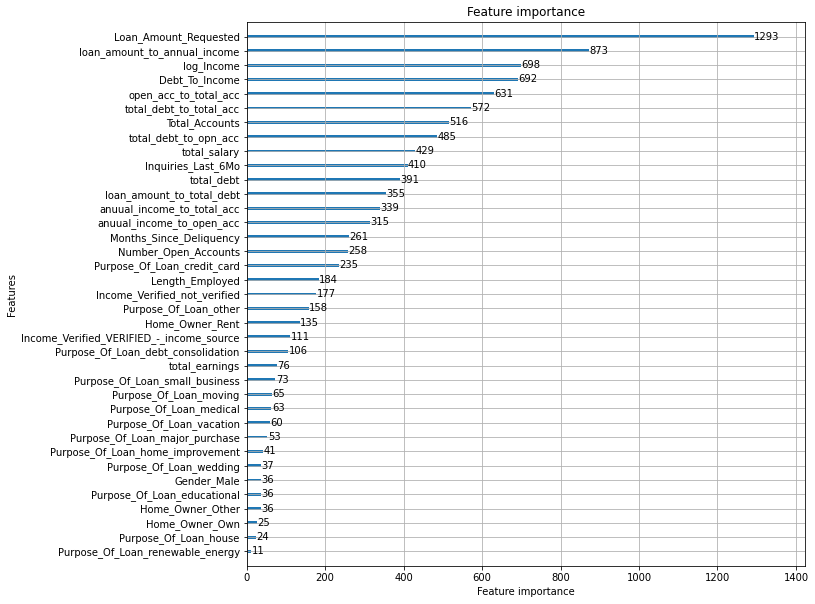

In [121]:
import lightgbm
lightgbm.plot_importance(model,figsize=(10,10))